In [49]:
from mnist import MNIST
import pandas as pd
import numpy as np
from scipy.stats import norm
import math
import os
import matplotlib.pyplot as plt
import sys
from PIL import ImageOps, Image

In [50]:
mndata = MNIST('/Users/josenoriegaportilla/')

image_training, labels_training = mndata.load_training()
image_testing, labels_testing = mndata.load_testing()

In [51]:
image_training = np.array(image_training)
labels_training = np.array(labels_training)
image_testing = np.array(image_testing)
labels_testing = np.array(labels_testing)

print(len(image_training))
print(len(labels_training))
print(len(image_testing))
print(len(labels_testing))

60000
60000
10000
10000


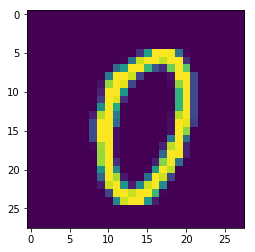

In [52]:
def show_image(pixels):
    image = pixels.reshape(28,28)
    plt.imshow(image)
    plt.show()
    
show_image(image_training[1000])

In [53]:
def covariance(images, labels, mean):
    
    class_cov = np.zeros((10, len(images[0]), len(images[0])))
    
    identity_matrix = np.identity(len(images[0]))
    identity_matrix = np.multiply(identity_matrix, 0.01)
    
    for i in range(10):
        
        print(f'Calculating Covariance for class {i}')
        
        indices = np.where(labels == i)[0]
        
        class_images = images[indices]
        
        class_mean = mean[i]
        
        for j in range(len(class_images)):
            
            #print(f'Doing image {j} of class {i}')

            distance_to_mean = np.subtract(class_images[j], class_mean)
        
            product = np.outer(distance_to_mean, distance_to_mean)
            
            class_cov[i] = np.add(class_cov[i], product)            
        
        class_cov[i] = np.divide(class_cov[i], len(class_images))
        
        class_cov[i] = np.add(class_cov[i], identity_matrix)

    return class_cov
    

In [54]:
def mean(images, labels):
    mean_class = np.zeros((10,len(images[0])))
    
    for i in range(10):
        
        indices = np.where(labels == i)[0]
        
        mean_class[i] = np.mean(images[indices], axis = 0)
    
    return mean_class

In [55]:
def classPrior(images, labels):
    priors = np.zeros((10))
    
    for i in range(10):
        
        indices = np.where(labels == i)[0]
        
        priors[i] = len(indices)/len(images)
        
    return priors

In [56]:
def gaussian_term(covariance):
    
    gaussian_terms = {}
    
    for i in range(10):
        class_covariance = np.array(covariance[i], dtype=np.float64)
        
        sign, log_determinant = np.linalg.slogdet(class_covariance)
        cov_determinant = np.multiply(sign, log_determinant)
        
        cov_determinant = np.multiply(1/2, cov_determinant)
        
        other_term = np.multiply(len(covariance[i])/2, np.log(np.pi))
        
        gaussian_terms[i] = np.subtract(other_term, cov_determinant)
        
    return gaussian_terms

In [57]:
def likelihood(covariance, mean, prior, other_terms, image_testing):
    
    print('Model Training Complete')
    
    classifications = []
    
    for i in range(len(image_testing)):
        
        print(f'Classifying Image {i}')
        
        class_likelihoods = []
        
        for j in range(10):
            
            current_image = image_testing[i]
            
            class_mean = mean[j]
            class_cov = np.linalg.inv(covariance[j])
            
            mean_diff = np.subtract(current_image, class_mean)
            mean_diff_t = np.transpose(mean_diff)
            
            gaussian_product = np.dot(class_cov, mean_diff)
            gaussian_product = np.dot(mean_diff_t, gaussian_product)
            
            class_likelihood = np.subtract(other_terms[j], gaussian_product)
            class_likelihood = np.add(class_likelihood, prior[j])
            
            
            class_likelihoods.append(class_likelihood)
        
        classification = classify(class_likelihoods)
        
        classifications.append(classification)
    
    return classifications

In [58]:
def classify(class_likelihoods):
    return np.argmax(class_likelihoods)

In [59]:
def accuracy(predictions, labels_testing):
    
    print('Calculating Accuracy...')
    
    test_size = len(predictions)
    correct_predictions = 0
    
    for i in range(test_size):
        if predictions[i] == labels_testing[i]:
            correct_predictions = correct_predictions + 1 #correct_predictions += 1
            
    accuracy = correct_predictions / test_size
        
    return accuracy*100

In [60]:
def MNIST_model(image_training, labels_training, image_testing, labels_testing):
    
    class_mean = mean(image_training, labels_training)
    
    class_covariance = covariance(image_training, labels_training, class_mean)
    
    class_prior = classPrior(image_training, labels_training)
    
    predictions = likelihood(class_covariance, class_mean, class_prior, image_testing) ## classifications
    
    prediction_accuracy = accuracy(predictions, labels_testing)
    
    return prediction_accuracy
    

In [61]:
class MNIST_model:
    
    def __init__(self, distribution='Gaussian'):
        self.distribution = distribution
        self.covariance = None
        self.other_terms = None
        self.mean = None
        self.prior = None

    def fit(self, train_features, train_labels):

        self.mean = mean(train_features, train_labels)
        self.covariance = covariance(train_features, train_labels, self.mean)
        self.other_terms = gaussian_term(self.covariance)
        self.prior = classPrior(train_features, train_labels)

        print('Model Training Complete')

        return


    def score(self, test_features, test_labels):

        classifications = likelihood(self.covariance, self.mean, self.prior, self.other_terms, test_features)

        test_accuracy = accuracy(classifications, test_labels)
        
        print(f"Model Accuracy {test_accuracy}")

        return

In [62]:
gaussian_model = MNIST_model()

In [63]:
gaussian_model.fit(image_training, labels_training)

Calculating Covariance for class 0
Calculating Covariance for class 1
Calculating Covariance for class 2
Calculating Covariance for class 3
Calculating Covariance for class 4
Calculating Covariance for class 5
Calculating Covariance for class 6
Calculating Covariance for class 7
Calculating Covariance for class 8
Calculating Covariance for class 9
Model Training Complete


In [64]:
gaussian_model.score(image_training, labels_training)

Model Training Complete
Classifying Image 0
Classifying Image 1
Classifying Image 2
Classifying Image 3
Classifying Image 4
Classifying Image 5
Classifying Image 6
Classifying Image 7
Classifying Image 8
Classifying Image 9
Classifying Image 10
Classifying Image 11
Classifying Image 12
Classifying Image 13
Classifying Image 14
Classifying Image 15
Classifying Image 16
Classifying Image 17
Classifying Image 18
Classifying Image 19
Classifying Image 20
Classifying Image 21
Classifying Image 22
Classifying Image 23
Classifying Image 24
Classifying Image 25
Classifying Image 26
Classifying Image 27
Classifying Image 28
Classifying Image 29
Classifying Image 30
Classifying Image 31
Classifying Image 32
Classifying Image 33
Classifying Image 34
Classifying Image 35
Classifying Image 36
Classifying Image 37
Classifying Image 38
Classifying Image 39
Classifying Image 40
Classifying Image 41
Classifying Image 42
Classifying Image 43
Classifying Image 44
Classifying Image 45
Classifying Image 46

Classifying Image 377
Classifying Image 378
Classifying Image 379
Classifying Image 380
Classifying Image 381
Classifying Image 382
Classifying Image 383
Classifying Image 384
Classifying Image 385
Classifying Image 386
Classifying Image 387
Classifying Image 388
Classifying Image 389
Classifying Image 390
Classifying Image 391
Classifying Image 392
Classifying Image 393
Classifying Image 394
Classifying Image 395
Classifying Image 396
Classifying Image 397
Classifying Image 398
Classifying Image 399
Classifying Image 400
Classifying Image 401
Classifying Image 402
Classifying Image 403
Classifying Image 404
Classifying Image 405
Classifying Image 406
Classifying Image 407
Classifying Image 408
Classifying Image 409
Classifying Image 410
Classifying Image 411
Classifying Image 412
Classifying Image 413
Classifying Image 414
Classifying Image 415
Classifying Image 416
Classifying Image 417
Classifying Image 418
Classifying Image 419
Classifying Image 420
Classifying Image 421
Classifyin

Classifying Image 750
Classifying Image 751
Classifying Image 752
Classifying Image 753
Classifying Image 754
Classifying Image 755
Classifying Image 756
Classifying Image 757
Classifying Image 758
Classifying Image 759
Classifying Image 760
Classifying Image 761
Classifying Image 762
Classifying Image 763
Classifying Image 764
Classifying Image 765
Classifying Image 766
Classifying Image 767
Classifying Image 768
Classifying Image 769
Classifying Image 770
Classifying Image 771
Classifying Image 772
Classifying Image 773
Classifying Image 774
Classifying Image 775
Classifying Image 776
Classifying Image 777
Classifying Image 778
Classifying Image 779
Classifying Image 780
Classifying Image 781
Classifying Image 782
Classifying Image 783
Classifying Image 784
Classifying Image 785
Classifying Image 786
Classifying Image 787
Classifying Image 788
Classifying Image 789
Classifying Image 790
Classifying Image 791
Classifying Image 792
Classifying Image 793
Classifying Image 794
Classifyin

Classifying Image 1118
Classifying Image 1119
Classifying Image 1120
Classifying Image 1121
Classifying Image 1122
Classifying Image 1123
Classifying Image 1124
Classifying Image 1125
Classifying Image 1126
Classifying Image 1127
Classifying Image 1128
Classifying Image 1129
Classifying Image 1130
Classifying Image 1131
Classifying Image 1132
Classifying Image 1133
Classifying Image 1134
Classifying Image 1135
Classifying Image 1136
Classifying Image 1137
Classifying Image 1138
Classifying Image 1139
Classifying Image 1140
Classifying Image 1141
Classifying Image 1142
Classifying Image 1143
Classifying Image 1144
Classifying Image 1145
Classifying Image 1146
Classifying Image 1147
Classifying Image 1148
Classifying Image 1149
Classifying Image 1150
Classifying Image 1151
Classifying Image 1152
Classifying Image 1153
Classifying Image 1154
Classifying Image 1155
Classifying Image 1156
Classifying Image 1157
Classifying Image 1158
Classifying Image 1159
Classifying Image 1160
Classifying

Classifying Image 1475
Classifying Image 1476
Classifying Image 1477
Classifying Image 1478
Classifying Image 1479
Classifying Image 1480
Classifying Image 1481
Classifying Image 1482
Classifying Image 1483
Classifying Image 1484
Classifying Image 1485
Classifying Image 1486
Classifying Image 1487
Classifying Image 1488
Classifying Image 1489
Classifying Image 1490
Classifying Image 1491
Classifying Image 1492
Classifying Image 1493
Classifying Image 1494
Classifying Image 1495
Classifying Image 1496
Classifying Image 1497
Classifying Image 1498
Classifying Image 1499
Classifying Image 1500
Classifying Image 1501
Classifying Image 1502
Classifying Image 1503
Classifying Image 1504
Classifying Image 1505
Classifying Image 1506
Classifying Image 1507
Classifying Image 1508
Classifying Image 1509
Classifying Image 1510
Classifying Image 1511
Classifying Image 1512
Classifying Image 1513
Classifying Image 1514
Classifying Image 1515
Classifying Image 1516
Classifying Image 1517
Classifying

Classifying Image 1832
Classifying Image 1833
Classifying Image 1834
Classifying Image 1835
Classifying Image 1836
Classifying Image 1837
Classifying Image 1838
Classifying Image 1839
Classifying Image 1840
Classifying Image 1841
Classifying Image 1842
Classifying Image 1843
Classifying Image 1844
Classifying Image 1845
Classifying Image 1846
Classifying Image 1847
Classifying Image 1848
Classifying Image 1849
Classifying Image 1850
Classifying Image 1851
Classifying Image 1852
Classifying Image 1853
Classifying Image 1854
Classifying Image 1855
Classifying Image 1856
Classifying Image 1857
Classifying Image 1858
Classifying Image 1859
Classifying Image 1860
Classifying Image 1861
Classifying Image 1862
Classifying Image 1863
Classifying Image 1864
Classifying Image 1865
Classifying Image 1866
Classifying Image 1867
Classifying Image 1868
Classifying Image 1869
Classifying Image 1870
Classifying Image 1871
Classifying Image 1872
Classifying Image 1873
Classifying Image 1874
Classifying

Classifying Image 2189
Classifying Image 2190
Classifying Image 2191
Classifying Image 2192
Classifying Image 2193
Classifying Image 2194
Classifying Image 2195
Classifying Image 2196
Classifying Image 2197
Classifying Image 2198
Classifying Image 2199
Classifying Image 2200
Classifying Image 2201
Classifying Image 2202
Classifying Image 2203
Classifying Image 2204
Classifying Image 2205
Classifying Image 2206
Classifying Image 2207
Classifying Image 2208
Classifying Image 2209
Classifying Image 2210
Classifying Image 2211
Classifying Image 2212
Classifying Image 2213
Classifying Image 2214
Classifying Image 2215
Classifying Image 2216
Classifying Image 2217
Classifying Image 2218
Classifying Image 2219
Classifying Image 2220
Classifying Image 2221
Classifying Image 2222
Classifying Image 2223
Classifying Image 2224
Classifying Image 2225
Classifying Image 2226
Classifying Image 2227
Classifying Image 2228
Classifying Image 2229
Classifying Image 2230
Classifying Image 2231
Classifying

Classifying Image 2546
Classifying Image 2547
Classifying Image 2548
Classifying Image 2549
Classifying Image 2550
Classifying Image 2551
Classifying Image 2552
Classifying Image 2553
Classifying Image 2554
Classifying Image 2555
Classifying Image 2556
Classifying Image 2557
Classifying Image 2558
Classifying Image 2559
Classifying Image 2560
Classifying Image 2561
Classifying Image 2562
Classifying Image 2563
Classifying Image 2564
Classifying Image 2565
Classifying Image 2566
Classifying Image 2567
Classifying Image 2568
Classifying Image 2569
Classifying Image 2570
Classifying Image 2571
Classifying Image 2572
Classifying Image 2573
Classifying Image 2574
Classifying Image 2575
Classifying Image 2576
Classifying Image 2577
Classifying Image 2578
Classifying Image 2579
Classifying Image 2580
Classifying Image 2581
Classifying Image 2582
Classifying Image 2583
Classifying Image 2584
Classifying Image 2585
Classifying Image 2586
Classifying Image 2587
Classifying Image 2588
Classifying

Classifying Image 2903
Classifying Image 2904
Classifying Image 2905
Classifying Image 2906
Classifying Image 2907
Classifying Image 2908
Classifying Image 2909
Classifying Image 2910
Classifying Image 2911
Classifying Image 2912
Classifying Image 2913
Classifying Image 2914
Classifying Image 2915
Classifying Image 2916
Classifying Image 2917
Classifying Image 2918
Classifying Image 2919
Classifying Image 2920
Classifying Image 2921
Classifying Image 2922
Classifying Image 2923
Classifying Image 2924
Classifying Image 2925
Classifying Image 2926
Classifying Image 2927
Classifying Image 2928
Classifying Image 2929
Classifying Image 2930
Classifying Image 2931
Classifying Image 2932
Classifying Image 2933
Classifying Image 2934
Classifying Image 2935
Classifying Image 2936
Classifying Image 2937
Classifying Image 2938
Classifying Image 2939
Classifying Image 2940
Classifying Image 2941
Classifying Image 2942
Classifying Image 2943
Classifying Image 2944
Classifying Image 2945
Classifying

Classifying Image 3260
Classifying Image 3261
Classifying Image 3262
Classifying Image 3263
Classifying Image 3264
Classifying Image 3265
Classifying Image 3266
Classifying Image 3267
Classifying Image 3268
Classifying Image 3269
Classifying Image 3270
Classifying Image 3271
Classifying Image 3272
Classifying Image 3273
Classifying Image 3274
Classifying Image 3275
Classifying Image 3276
Classifying Image 3277
Classifying Image 3278
Classifying Image 3279
Classifying Image 3280
Classifying Image 3281
Classifying Image 3282
Classifying Image 3283
Classifying Image 3284
Classifying Image 3285
Classifying Image 3286
Classifying Image 3287
Classifying Image 3288
Classifying Image 3289
Classifying Image 3290
Classifying Image 3291
Classifying Image 3292
Classifying Image 3293
Classifying Image 3294
Classifying Image 3295
Classifying Image 3296
Classifying Image 3297
Classifying Image 3298
Classifying Image 3299
Classifying Image 3300
Classifying Image 3301
Classifying Image 3302
Classifying

Classifying Image 3617
Classifying Image 3618
Classifying Image 3619
Classifying Image 3620
Classifying Image 3621
Classifying Image 3622
Classifying Image 3623
Classifying Image 3624
Classifying Image 3625
Classifying Image 3626
Classifying Image 3627
Classifying Image 3628
Classifying Image 3629
Classifying Image 3630
Classifying Image 3631
Classifying Image 3632
Classifying Image 3633
Classifying Image 3634
Classifying Image 3635
Classifying Image 3636
Classifying Image 3637
Classifying Image 3638
Classifying Image 3639
Classifying Image 3640
Classifying Image 3641
Classifying Image 3642
Classifying Image 3643
Classifying Image 3644
Classifying Image 3645
Classifying Image 3646
Classifying Image 3647
Classifying Image 3648
Classifying Image 3649
Classifying Image 3650
Classifying Image 3651
Classifying Image 3652
Classifying Image 3653
Classifying Image 3654
Classifying Image 3655
Classifying Image 3656
Classifying Image 3657
Classifying Image 3658
Classifying Image 3659
Classifying

Classifying Image 3974
Classifying Image 3975
Classifying Image 3976
Classifying Image 3977
Classifying Image 3978
Classifying Image 3979
Classifying Image 3980
Classifying Image 3981
Classifying Image 3982
Classifying Image 3983
Classifying Image 3984
Classifying Image 3985
Classifying Image 3986
Classifying Image 3987
Classifying Image 3988
Classifying Image 3989
Classifying Image 3990
Classifying Image 3991
Classifying Image 3992
Classifying Image 3993
Classifying Image 3994
Classifying Image 3995
Classifying Image 3996
Classifying Image 3997
Classifying Image 3998
Classifying Image 3999
Classifying Image 4000
Classifying Image 4001
Classifying Image 4002
Classifying Image 4003
Classifying Image 4004
Classifying Image 4005
Classifying Image 4006
Classifying Image 4007
Classifying Image 4008
Classifying Image 4009
Classifying Image 4010
Classifying Image 4011
Classifying Image 4012
Classifying Image 4013
Classifying Image 4014
Classifying Image 4015
Classifying Image 4016
Classifying

Classifying Image 4331
Classifying Image 4332
Classifying Image 4333
Classifying Image 4334
Classifying Image 4335
Classifying Image 4336
Classifying Image 4337
Classifying Image 4338
Classifying Image 4339
Classifying Image 4340
Classifying Image 4341
Classifying Image 4342
Classifying Image 4343
Classifying Image 4344
Classifying Image 4345
Classifying Image 4346
Classifying Image 4347
Classifying Image 4348
Classifying Image 4349
Classifying Image 4350
Classifying Image 4351
Classifying Image 4352
Classifying Image 4353
Classifying Image 4354
Classifying Image 4355
Classifying Image 4356
Classifying Image 4357
Classifying Image 4358
Classifying Image 4359
Classifying Image 4360
Classifying Image 4361
Classifying Image 4362
Classifying Image 4363
Classifying Image 4364
Classifying Image 4365
Classifying Image 4366
Classifying Image 4367
Classifying Image 4368
Classifying Image 4369
Classifying Image 4370
Classifying Image 4371
Classifying Image 4372
Classifying Image 4373
Classifying

Classifying Image 4688
Classifying Image 4689
Classifying Image 4690
Classifying Image 4691
Classifying Image 4692
Classifying Image 4693
Classifying Image 4694
Classifying Image 4695
Classifying Image 4696
Classifying Image 4697
Classifying Image 4698
Classifying Image 4699
Classifying Image 4700
Classifying Image 4701
Classifying Image 4702
Classifying Image 4703
Classifying Image 4704
Classifying Image 4705
Classifying Image 4706
Classifying Image 4707
Classifying Image 4708
Classifying Image 4709
Classifying Image 4710
Classifying Image 4711
Classifying Image 4712
Classifying Image 4713
Classifying Image 4714
Classifying Image 4715
Classifying Image 4716
Classifying Image 4717
Classifying Image 4718
Classifying Image 4719
Classifying Image 4720
Classifying Image 4721
Classifying Image 4722
Classifying Image 4723
Classifying Image 4724
Classifying Image 4725
Classifying Image 4726
Classifying Image 4727
Classifying Image 4728
Classifying Image 4729
Classifying Image 4730
Classifying

Classifying Image 5045
Classifying Image 5046
Classifying Image 5047
Classifying Image 5048
Classifying Image 5049
Classifying Image 5050
Classifying Image 5051
Classifying Image 5052
Classifying Image 5053
Classifying Image 5054
Classifying Image 5055
Classifying Image 5056
Classifying Image 5057
Classifying Image 5058
Classifying Image 5059
Classifying Image 5060
Classifying Image 5061
Classifying Image 5062
Classifying Image 5063
Classifying Image 5064
Classifying Image 5065
Classifying Image 5066
Classifying Image 5067
Classifying Image 5068
Classifying Image 5069
Classifying Image 5070
Classifying Image 5071
Classifying Image 5072
Classifying Image 5073
Classifying Image 5074
Classifying Image 5075
Classifying Image 5076
Classifying Image 5077
Classifying Image 5078
Classifying Image 5079
Classifying Image 5080
Classifying Image 5081
Classifying Image 5082
Classifying Image 5083
Classifying Image 5084
Classifying Image 5085
Classifying Image 5086
Classifying Image 5087
Classifying

Classifying Image 5402
Classifying Image 5403
Classifying Image 5404
Classifying Image 5405
Classifying Image 5406
Classifying Image 5407
Classifying Image 5408
Classifying Image 5409
Classifying Image 5410
Classifying Image 5411
Classifying Image 5412
Classifying Image 5413
Classifying Image 5414
Classifying Image 5415
Classifying Image 5416
Classifying Image 5417
Classifying Image 5418
Classifying Image 5419
Classifying Image 5420
Classifying Image 5421
Classifying Image 5422
Classifying Image 5423
Classifying Image 5424
Classifying Image 5425
Classifying Image 5426
Classifying Image 5427
Classifying Image 5428
Classifying Image 5429
Classifying Image 5430
Classifying Image 5431
Classifying Image 5432
Classifying Image 5433
Classifying Image 5434
Classifying Image 5435
Classifying Image 5436
Classifying Image 5437
Classifying Image 5438
Classifying Image 5439
Classifying Image 5440
Classifying Image 5441
Classifying Image 5442
Classifying Image 5443
Classifying Image 5444
Classifying

Classifying Image 5759
Classifying Image 5760
Classifying Image 5761
Classifying Image 5762
Classifying Image 5763
Classifying Image 5764
Classifying Image 5765
Classifying Image 5766
Classifying Image 5767
Classifying Image 5768
Classifying Image 5769
Classifying Image 5770
Classifying Image 5771
Classifying Image 5772
Classifying Image 5773
Classifying Image 5774
Classifying Image 5775
Classifying Image 5776
Classifying Image 5777
Classifying Image 5778
Classifying Image 5779
Classifying Image 5780
Classifying Image 5781
Classifying Image 5782
Classifying Image 5783
Classifying Image 5784
Classifying Image 5785
Classifying Image 5786
Classifying Image 5787
Classifying Image 5788
Classifying Image 5789
Classifying Image 5790
Classifying Image 5791
Classifying Image 5792
Classifying Image 5793
Classifying Image 5794
Classifying Image 5795
Classifying Image 5796
Classifying Image 5797
Classifying Image 5798
Classifying Image 5799
Classifying Image 5800
Classifying Image 5801
Classifying

Classifying Image 6116
Classifying Image 6117
Classifying Image 6118
Classifying Image 6119
Classifying Image 6120
Classifying Image 6121
Classifying Image 6122
Classifying Image 6123
Classifying Image 6124
Classifying Image 6125
Classifying Image 6126
Classifying Image 6127
Classifying Image 6128
Classifying Image 6129
Classifying Image 6130
Classifying Image 6131
Classifying Image 6132
Classifying Image 6133
Classifying Image 6134
Classifying Image 6135
Classifying Image 6136
Classifying Image 6137
Classifying Image 6138
Classifying Image 6139
Classifying Image 6140
Classifying Image 6141
Classifying Image 6142
Classifying Image 6143
Classifying Image 6144
Classifying Image 6145
Classifying Image 6146
Classifying Image 6147
Classifying Image 6148
Classifying Image 6149
Classifying Image 6150
Classifying Image 6151
Classifying Image 6152
Classifying Image 6153
Classifying Image 6154
Classifying Image 6155
Classifying Image 6156
Classifying Image 6157
Classifying Image 6158
Classifying

Classifying Image 6473
Classifying Image 6474
Classifying Image 6475
Classifying Image 6476
Classifying Image 6477
Classifying Image 6478
Classifying Image 6479
Classifying Image 6480
Classifying Image 6481
Classifying Image 6482
Classifying Image 6483
Classifying Image 6484
Classifying Image 6485
Classifying Image 6486
Classifying Image 6487
Classifying Image 6488
Classifying Image 6489
Classifying Image 6490
Classifying Image 6491
Classifying Image 6492
Classifying Image 6493
Classifying Image 6494
Classifying Image 6495
Classifying Image 6496
Classifying Image 6497
Classifying Image 6498
Classifying Image 6499
Classifying Image 6500
Classifying Image 6501
Classifying Image 6502
Classifying Image 6503
Classifying Image 6504
Classifying Image 6505
Classifying Image 6506
Classifying Image 6507
Classifying Image 6508
Classifying Image 6509
Classifying Image 6510
Classifying Image 6511
Classifying Image 6512
Classifying Image 6513
Classifying Image 6514
Classifying Image 6515
Classifying

Classifying Image 6830
Classifying Image 6831
Classifying Image 6832
Classifying Image 6833
Classifying Image 6834
Classifying Image 6835
Classifying Image 6836
Classifying Image 6837
Classifying Image 6838
Classifying Image 6839
Classifying Image 6840
Classifying Image 6841
Classifying Image 6842
Classifying Image 6843
Classifying Image 6844
Classifying Image 6845
Classifying Image 6846
Classifying Image 6847
Classifying Image 6848
Classifying Image 6849
Classifying Image 6850
Classifying Image 6851
Classifying Image 6852
Classifying Image 6853
Classifying Image 6854
Classifying Image 6855
Classifying Image 6856
Classifying Image 6857
Classifying Image 6858
Classifying Image 6859
Classifying Image 6860
Classifying Image 6861
Classifying Image 6862
Classifying Image 6863
Classifying Image 6864
Classifying Image 6865
Classifying Image 6866
Classifying Image 6867
Classifying Image 6868
Classifying Image 6869
Classifying Image 6870
Classifying Image 6871
Classifying Image 6872
Classifying

Classifying Image 7187
Classifying Image 7188
Classifying Image 7189
Classifying Image 7190
Classifying Image 7191
Classifying Image 7192
Classifying Image 7193
Classifying Image 7194
Classifying Image 7195
Classifying Image 7196
Classifying Image 7197
Classifying Image 7198
Classifying Image 7199
Classifying Image 7200
Classifying Image 7201
Classifying Image 7202
Classifying Image 7203
Classifying Image 7204
Classifying Image 7205
Classifying Image 7206
Classifying Image 7207
Classifying Image 7208
Classifying Image 7209
Classifying Image 7210
Classifying Image 7211
Classifying Image 7212
Classifying Image 7213
Classifying Image 7214
Classifying Image 7215
Classifying Image 7216
Classifying Image 7217
Classifying Image 7218
Classifying Image 7219
Classifying Image 7220
Classifying Image 7221
Classifying Image 7222
Classifying Image 7223
Classifying Image 7224
Classifying Image 7225
Classifying Image 7226
Classifying Image 7227
Classifying Image 7228
Classifying Image 7229
Classifying

Classifying Image 7544
Classifying Image 7545
Classifying Image 7546
Classifying Image 7547
Classifying Image 7548
Classifying Image 7549
Classifying Image 7550
Classifying Image 7551
Classifying Image 7552
Classifying Image 7553
Classifying Image 7554
Classifying Image 7555
Classifying Image 7556
Classifying Image 7557
Classifying Image 7558
Classifying Image 7559
Classifying Image 7560
Classifying Image 7561
Classifying Image 7562
Classifying Image 7563
Classifying Image 7564
Classifying Image 7565
Classifying Image 7566
Classifying Image 7567
Classifying Image 7568
Classifying Image 7569
Classifying Image 7570
Classifying Image 7571
Classifying Image 7572
Classifying Image 7573
Classifying Image 7574
Classifying Image 7575
Classifying Image 7576
Classifying Image 7577
Classifying Image 7578
Classifying Image 7579
Classifying Image 7580
Classifying Image 7581
Classifying Image 7582
Classifying Image 7583
Classifying Image 7584
Classifying Image 7585
Classifying Image 7586
Classifying

Classifying Image 7901
Classifying Image 7902
Classifying Image 7903
Classifying Image 7904
Classifying Image 7905
Classifying Image 7906
Classifying Image 7907
Classifying Image 7908
Classifying Image 7909
Classifying Image 7910
Classifying Image 7911
Classifying Image 7912
Classifying Image 7913
Classifying Image 7914
Classifying Image 7915
Classifying Image 7916
Classifying Image 7917
Classifying Image 7918
Classifying Image 7919
Classifying Image 7920
Classifying Image 7921
Classifying Image 7922
Classifying Image 7923
Classifying Image 7924
Classifying Image 7925
Classifying Image 7926
Classifying Image 7927
Classifying Image 7928
Classifying Image 7929
Classifying Image 7930
Classifying Image 7931
Classifying Image 7932
Classifying Image 7933
Classifying Image 7934
Classifying Image 7935
Classifying Image 7936
Classifying Image 7937
Classifying Image 7938
Classifying Image 7939
Classifying Image 7940
Classifying Image 7941
Classifying Image 7942
Classifying Image 7943
Classifying

Classifying Image 8258
Classifying Image 8259
Classifying Image 8260
Classifying Image 8261
Classifying Image 8262
Classifying Image 8263
Classifying Image 8264
Classifying Image 8265
Classifying Image 8266
Classifying Image 8267
Classifying Image 8268
Classifying Image 8269
Classifying Image 8270
Classifying Image 8271
Classifying Image 8272
Classifying Image 8273
Classifying Image 8274
Classifying Image 8275
Classifying Image 8276
Classifying Image 8277
Classifying Image 8278
Classifying Image 8279
Classifying Image 8280
Classifying Image 8281
Classifying Image 8282
Classifying Image 8283
Classifying Image 8284
Classifying Image 8285
Classifying Image 8286
Classifying Image 8287
Classifying Image 8288
Classifying Image 8289
Classifying Image 8290
Classifying Image 8291
Classifying Image 8292
Classifying Image 8293
Classifying Image 8294
Classifying Image 8295
Classifying Image 8296
Classifying Image 8297
Classifying Image 8298
Classifying Image 8299
Classifying Image 8300
Classifying

Classifying Image 8615
Classifying Image 8616
Classifying Image 8617
Classifying Image 8618
Classifying Image 8619
Classifying Image 8620
Classifying Image 8621
Classifying Image 8622
Classifying Image 8623
Classifying Image 8624
Classifying Image 8625
Classifying Image 8626
Classifying Image 8627
Classifying Image 8628
Classifying Image 8629
Classifying Image 8630
Classifying Image 8631
Classifying Image 8632
Classifying Image 8633
Classifying Image 8634
Classifying Image 8635
Classifying Image 8636
Classifying Image 8637
Classifying Image 8638
Classifying Image 8639
Classifying Image 8640
Classifying Image 8641
Classifying Image 8642
Classifying Image 8643
Classifying Image 8644
Classifying Image 8645
Classifying Image 8646
Classifying Image 8647
Classifying Image 8648
Classifying Image 8649
Classifying Image 8650
Classifying Image 8651
Classifying Image 8652
Classifying Image 8653
Classifying Image 8654
Classifying Image 8655
Classifying Image 8656
Classifying Image 8657
Classifying

Classifying Image 8972
Classifying Image 8973
Classifying Image 8974
Classifying Image 8975
Classifying Image 8976
Classifying Image 8977
Classifying Image 8978
Classifying Image 8979
Classifying Image 8980
Classifying Image 8981
Classifying Image 8982
Classifying Image 8983
Classifying Image 8984
Classifying Image 8985
Classifying Image 8986
Classifying Image 8987
Classifying Image 8988
Classifying Image 8989
Classifying Image 8990
Classifying Image 8991
Classifying Image 8992
Classifying Image 8993
Classifying Image 8994
Classifying Image 8995
Classifying Image 8996
Classifying Image 8997
Classifying Image 8998
Classifying Image 8999
Classifying Image 9000
Classifying Image 9001
Classifying Image 9002
Classifying Image 9003
Classifying Image 9004
Classifying Image 9005
Classifying Image 9006
Classifying Image 9007
Classifying Image 9008
Classifying Image 9009
Classifying Image 9010
Classifying Image 9011
Classifying Image 9012
Classifying Image 9013
Classifying Image 9014
Classifying

Classifying Image 9329
Classifying Image 9330
Classifying Image 9331
Classifying Image 9332
Classifying Image 9333
Classifying Image 9334
Classifying Image 9335
Classifying Image 9336
Classifying Image 9337
Classifying Image 9338
Classifying Image 9339
Classifying Image 9340
Classifying Image 9341
Classifying Image 9342
Classifying Image 9343
Classifying Image 9344
Classifying Image 9345
Classifying Image 9346
Classifying Image 9347
Classifying Image 9348
Classifying Image 9349
Classifying Image 9350
Classifying Image 9351
Classifying Image 9352
Classifying Image 9353
Classifying Image 9354
Classifying Image 9355
Classifying Image 9356
Classifying Image 9357
Classifying Image 9358
Classifying Image 9359
Classifying Image 9360
Classifying Image 9361
Classifying Image 9362
Classifying Image 9363
Classifying Image 9364
Classifying Image 9365
Classifying Image 9366
Classifying Image 9367
Classifying Image 9368
Classifying Image 9369
Classifying Image 9370
Classifying Image 9371
Classifying

Classifying Image 9686
Classifying Image 9687
Classifying Image 9688
Classifying Image 9689
Classifying Image 9690
Classifying Image 9691
Classifying Image 9692
Classifying Image 9693
Classifying Image 9694
Classifying Image 9695
Classifying Image 9696
Classifying Image 9697
Classifying Image 9698
Classifying Image 9699
Classifying Image 9700
Classifying Image 9701
Classifying Image 9702
Classifying Image 9703
Classifying Image 9704
Classifying Image 9705
Classifying Image 9706
Classifying Image 9707
Classifying Image 9708
Classifying Image 9709
Classifying Image 9710
Classifying Image 9711
Classifying Image 9712
Classifying Image 9713
Classifying Image 9714
Classifying Image 9715
Classifying Image 9716
Classifying Image 9717
Classifying Image 9718
Classifying Image 9719
Classifying Image 9720
Classifying Image 9721
Classifying Image 9722
Classifying Image 9723
Classifying Image 9724
Classifying Image 9725
Classifying Image 9726
Classifying Image 9727
Classifying Image 9728
Classifying

Classifying Image 10041
Classifying Image 10042
Classifying Image 10043
Classifying Image 10044
Classifying Image 10045
Classifying Image 10046
Classifying Image 10047
Classifying Image 10048
Classifying Image 10049
Classifying Image 10050
Classifying Image 10051
Classifying Image 10052
Classifying Image 10053
Classifying Image 10054
Classifying Image 10055
Classifying Image 10056
Classifying Image 10057
Classifying Image 10058
Classifying Image 10059
Classifying Image 10060
Classifying Image 10061
Classifying Image 10062
Classifying Image 10063
Classifying Image 10064
Classifying Image 10065
Classifying Image 10066
Classifying Image 10067
Classifying Image 10068
Classifying Image 10069
Classifying Image 10070
Classifying Image 10071
Classifying Image 10072
Classifying Image 10073
Classifying Image 10074
Classifying Image 10075
Classifying Image 10076
Classifying Image 10077
Classifying Image 10078
Classifying Image 10079
Classifying Image 10080
Classifying Image 10081
Classifying Imag

Classifying Image 10383
Classifying Image 10384
Classifying Image 10385
Classifying Image 10386
Classifying Image 10387
Classifying Image 10388
Classifying Image 10389
Classifying Image 10390
Classifying Image 10391
Classifying Image 10392
Classifying Image 10393
Classifying Image 10394
Classifying Image 10395
Classifying Image 10396
Classifying Image 10397
Classifying Image 10398
Classifying Image 10399
Classifying Image 10400
Classifying Image 10401
Classifying Image 10402
Classifying Image 10403
Classifying Image 10404
Classifying Image 10405
Classifying Image 10406
Classifying Image 10407
Classifying Image 10408
Classifying Image 10409
Classifying Image 10410
Classifying Image 10411
Classifying Image 10412
Classifying Image 10413
Classifying Image 10414
Classifying Image 10415
Classifying Image 10416
Classifying Image 10417
Classifying Image 10418
Classifying Image 10419
Classifying Image 10420
Classifying Image 10421
Classifying Image 10422
Classifying Image 10423
Classifying Imag

Classifying Image 10725
Classifying Image 10726
Classifying Image 10727
Classifying Image 10728
Classifying Image 10729
Classifying Image 10730
Classifying Image 10731
Classifying Image 10732
Classifying Image 10733
Classifying Image 10734
Classifying Image 10735
Classifying Image 10736
Classifying Image 10737
Classifying Image 10738
Classifying Image 10739
Classifying Image 10740
Classifying Image 10741
Classifying Image 10742
Classifying Image 10743
Classifying Image 10744
Classifying Image 10745
Classifying Image 10746
Classifying Image 10747
Classifying Image 10748
Classifying Image 10749
Classifying Image 10750
Classifying Image 10751
Classifying Image 10752
Classifying Image 10753
Classifying Image 10754
Classifying Image 10755
Classifying Image 10756
Classifying Image 10757
Classifying Image 10758
Classifying Image 10759
Classifying Image 10760
Classifying Image 10761
Classifying Image 10762
Classifying Image 10763
Classifying Image 10764
Classifying Image 10765
Classifying Imag

Classifying Image 11067
Classifying Image 11068
Classifying Image 11069
Classifying Image 11070
Classifying Image 11071
Classifying Image 11072
Classifying Image 11073
Classifying Image 11074
Classifying Image 11075
Classifying Image 11076
Classifying Image 11077
Classifying Image 11078
Classifying Image 11079
Classifying Image 11080
Classifying Image 11081
Classifying Image 11082
Classifying Image 11083
Classifying Image 11084
Classifying Image 11085
Classifying Image 11086
Classifying Image 11087
Classifying Image 11088
Classifying Image 11089
Classifying Image 11090
Classifying Image 11091
Classifying Image 11092
Classifying Image 11093
Classifying Image 11094
Classifying Image 11095
Classifying Image 11096
Classifying Image 11097
Classifying Image 11098
Classifying Image 11099
Classifying Image 11100
Classifying Image 11101
Classifying Image 11102
Classifying Image 11103
Classifying Image 11104
Classifying Image 11105
Classifying Image 11106
Classifying Image 11107
Classifying Imag

Classifying Image 11409
Classifying Image 11410
Classifying Image 11411
Classifying Image 11412
Classifying Image 11413
Classifying Image 11414
Classifying Image 11415
Classifying Image 11416
Classifying Image 11417
Classifying Image 11418
Classifying Image 11419
Classifying Image 11420
Classifying Image 11421
Classifying Image 11422
Classifying Image 11423
Classifying Image 11424
Classifying Image 11425
Classifying Image 11426
Classifying Image 11427
Classifying Image 11428
Classifying Image 11429
Classifying Image 11430
Classifying Image 11431
Classifying Image 11432
Classifying Image 11433
Classifying Image 11434
Classifying Image 11435
Classifying Image 11436
Classifying Image 11437
Classifying Image 11438
Classifying Image 11439
Classifying Image 11440
Classifying Image 11441
Classifying Image 11442
Classifying Image 11443
Classifying Image 11444
Classifying Image 11445
Classifying Image 11446
Classifying Image 11447
Classifying Image 11448
Classifying Image 11449
Classifying Imag

Classifying Image 11751
Classifying Image 11752
Classifying Image 11753
Classifying Image 11754
Classifying Image 11755
Classifying Image 11756
Classifying Image 11757
Classifying Image 11758
Classifying Image 11759
Classifying Image 11760
Classifying Image 11761
Classifying Image 11762
Classifying Image 11763
Classifying Image 11764
Classifying Image 11765
Classifying Image 11766
Classifying Image 11767
Classifying Image 11768
Classifying Image 11769
Classifying Image 11770
Classifying Image 11771
Classifying Image 11772
Classifying Image 11773
Classifying Image 11774
Classifying Image 11775
Classifying Image 11776
Classifying Image 11777
Classifying Image 11778
Classifying Image 11779
Classifying Image 11780
Classifying Image 11781
Classifying Image 11782
Classifying Image 11783
Classifying Image 11784
Classifying Image 11785
Classifying Image 11786
Classifying Image 11787
Classifying Image 11788
Classifying Image 11789
Classifying Image 11790
Classifying Image 11791
Classifying Imag

Classifying Image 12093
Classifying Image 12094
Classifying Image 12095
Classifying Image 12096
Classifying Image 12097
Classifying Image 12098
Classifying Image 12099
Classifying Image 12100
Classifying Image 12101
Classifying Image 12102
Classifying Image 12103
Classifying Image 12104
Classifying Image 12105
Classifying Image 12106
Classifying Image 12107
Classifying Image 12108
Classifying Image 12109
Classifying Image 12110
Classifying Image 12111
Classifying Image 12112
Classifying Image 12113
Classifying Image 12114
Classifying Image 12115
Classifying Image 12116
Classifying Image 12117
Classifying Image 12118
Classifying Image 12119
Classifying Image 12120
Classifying Image 12121
Classifying Image 12122
Classifying Image 12123
Classifying Image 12124
Classifying Image 12125
Classifying Image 12126
Classifying Image 12127
Classifying Image 12128
Classifying Image 12129
Classifying Image 12130
Classifying Image 12131
Classifying Image 12132
Classifying Image 12133
Classifying Imag

Classifying Image 12435
Classifying Image 12436
Classifying Image 12437
Classifying Image 12438
Classifying Image 12439
Classifying Image 12440
Classifying Image 12441
Classifying Image 12442
Classifying Image 12443
Classifying Image 12444
Classifying Image 12445
Classifying Image 12446
Classifying Image 12447
Classifying Image 12448
Classifying Image 12449
Classifying Image 12450
Classifying Image 12451
Classifying Image 12452
Classifying Image 12453
Classifying Image 12454
Classifying Image 12455
Classifying Image 12456
Classifying Image 12457
Classifying Image 12458
Classifying Image 12459
Classifying Image 12460
Classifying Image 12461
Classifying Image 12462
Classifying Image 12463
Classifying Image 12464
Classifying Image 12465
Classifying Image 12466
Classifying Image 12467
Classifying Image 12468
Classifying Image 12469
Classifying Image 12470
Classifying Image 12471
Classifying Image 12472
Classifying Image 12473
Classifying Image 12474
Classifying Image 12475
Classifying Imag

Classifying Image 12777
Classifying Image 12778
Classifying Image 12779
Classifying Image 12780
Classifying Image 12781
Classifying Image 12782
Classifying Image 12783
Classifying Image 12784
Classifying Image 12785
Classifying Image 12786
Classifying Image 12787
Classifying Image 12788
Classifying Image 12789
Classifying Image 12790
Classifying Image 12791
Classifying Image 12792
Classifying Image 12793
Classifying Image 12794
Classifying Image 12795
Classifying Image 12796
Classifying Image 12797
Classifying Image 12798
Classifying Image 12799
Classifying Image 12800
Classifying Image 12801
Classifying Image 12802
Classifying Image 12803
Classifying Image 12804
Classifying Image 12805
Classifying Image 12806
Classifying Image 12807
Classifying Image 12808
Classifying Image 12809
Classifying Image 12810
Classifying Image 12811
Classifying Image 12812
Classifying Image 12813
Classifying Image 12814
Classifying Image 12815
Classifying Image 12816
Classifying Image 12817
Classifying Imag

Classifying Image 13119
Classifying Image 13120
Classifying Image 13121
Classifying Image 13122
Classifying Image 13123
Classifying Image 13124
Classifying Image 13125
Classifying Image 13126
Classifying Image 13127
Classifying Image 13128
Classifying Image 13129
Classifying Image 13130
Classifying Image 13131
Classifying Image 13132
Classifying Image 13133
Classifying Image 13134
Classifying Image 13135
Classifying Image 13136
Classifying Image 13137
Classifying Image 13138
Classifying Image 13139
Classifying Image 13140
Classifying Image 13141
Classifying Image 13142
Classifying Image 13143
Classifying Image 13144
Classifying Image 13145
Classifying Image 13146
Classifying Image 13147
Classifying Image 13148
Classifying Image 13149
Classifying Image 13150
Classifying Image 13151
Classifying Image 13152
Classifying Image 13153
Classifying Image 13154
Classifying Image 13155
Classifying Image 13156
Classifying Image 13157
Classifying Image 13158
Classifying Image 13159
Classifying Imag

Classifying Image 13461
Classifying Image 13462
Classifying Image 13463
Classifying Image 13464
Classifying Image 13465
Classifying Image 13466
Classifying Image 13467
Classifying Image 13468
Classifying Image 13469
Classifying Image 13470
Classifying Image 13471
Classifying Image 13472
Classifying Image 13473
Classifying Image 13474
Classifying Image 13475
Classifying Image 13476
Classifying Image 13477
Classifying Image 13478
Classifying Image 13479
Classifying Image 13480
Classifying Image 13481
Classifying Image 13482
Classifying Image 13483
Classifying Image 13484
Classifying Image 13485
Classifying Image 13486
Classifying Image 13487
Classifying Image 13488
Classifying Image 13489
Classifying Image 13490
Classifying Image 13491
Classifying Image 13492
Classifying Image 13493
Classifying Image 13494
Classifying Image 13495
Classifying Image 13496
Classifying Image 13497
Classifying Image 13498
Classifying Image 13499
Classifying Image 13500
Classifying Image 13501
Classifying Imag

Classifying Image 13803
Classifying Image 13804
Classifying Image 13805
Classifying Image 13806
Classifying Image 13807
Classifying Image 13808
Classifying Image 13809
Classifying Image 13810
Classifying Image 13811
Classifying Image 13812
Classifying Image 13813
Classifying Image 13814
Classifying Image 13815
Classifying Image 13816
Classifying Image 13817
Classifying Image 13818
Classifying Image 13819
Classifying Image 13820
Classifying Image 13821
Classifying Image 13822
Classifying Image 13823
Classifying Image 13824
Classifying Image 13825
Classifying Image 13826
Classifying Image 13827
Classifying Image 13828
Classifying Image 13829
Classifying Image 13830
Classifying Image 13831
Classifying Image 13832
Classifying Image 13833
Classifying Image 13834
Classifying Image 13835
Classifying Image 13836
Classifying Image 13837
Classifying Image 13838
Classifying Image 13839
Classifying Image 13840
Classifying Image 13841
Classifying Image 13842
Classifying Image 13843
Classifying Imag

Classifying Image 14145
Classifying Image 14146
Classifying Image 14147
Classifying Image 14148
Classifying Image 14149
Classifying Image 14150
Classifying Image 14151
Classifying Image 14152
Classifying Image 14153
Classifying Image 14154
Classifying Image 14155
Classifying Image 14156
Classifying Image 14157
Classifying Image 14158
Classifying Image 14159
Classifying Image 14160
Classifying Image 14161
Classifying Image 14162
Classifying Image 14163
Classifying Image 14164
Classifying Image 14165
Classifying Image 14166
Classifying Image 14167
Classifying Image 14168
Classifying Image 14169
Classifying Image 14170
Classifying Image 14171
Classifying Image 14172
Classifying Image 14173
Classifying Image 14174
Classifying Image 14175
Classifying Image 14176
Classifying Image 14177
Classifying Image 14178
Classifying Image 14179
Classifying Image 14180
Classifying Image 14181
Classifying Image 14182
Classifying Image 14183
Classifying Image 14184
Classifying Image 14185
Classifying Imag

Classifying Image 14487
Classifying Image 14488
Classifying Image 14489
Classifying Image 14490
Classifying Image 14491
Classifying Image 14492
Classifying Image 14493
Classifying Image 14494
Classifying Image 14495
Classifying Image 14496
Classifying Image 14497
Classifying Image 14498
Classifying Image 14499
Classifying Image 14500
Classifying Image 14501
Classifying Image 14502
Classifying Image 14503
Classifying Image 14504
Classifying Image 14505
Classifying Image 14506
Classifying Image 14507
Classifying Image 14508
Classifying Image 14509
Classifying Image 14510
Classifying Image 14511
Classifying Image 14512
Classifying Image 14513
Classifying Image 14514
Classifying Image 14515
Classifying Image 14516
Classifying Image 14517
Classifying Image 14518
Classifying Image 14519
Classifying Image 14520
Classifying Image 14521
Classifying Image 14522
Classifying Image 14523
Classifying Image 14524
Classifying Image 14525
Classifying Image 14526
Classifying Image 14527
Classifying Imag

Classifying Image 14829
Classifying Image 14830
Classifying Image 14831
Classifying Image 14832
Classifying Image 14833
Classifying Image 14834
Classifying Image 14835
Classifying Image 14836
Classifying Image 14837
Classifying Image 14838
Classifying Image 14839
Classifying Image 14840
Classifying Image 14841
Classifying Image 14842
Classifying Image 14843
Classifying Image 14844
Classifying Image 14845
Classifying Image 14846
Classifying Image 14847
Classifying Image 14848
Classifying Image 14849
Classifying Image 14850
Classifying Image 14851
Classifying Image 14852
Classifying Image 14853
Classifying Image 14854
Classifying Image 14855
Classifying Image 14856
Classifying Image 14857
Classifying Image 14858
Classifying Image 14859
Classifying Image 14860
Classifying Image 14861
Classifying Image 14862
Classifying Image 14863
Classifying Image 14864
Classifying Image 14865
Classifying Image 14866
Classifying Image 14867
Classifying Image 14868
Classifying Image 14869
Classifying Imag

Classifying Image 15171
Classifying Image 15172
Classifying Image 15173
Classifying Image 15174
Classifying Image 15175
Classifying Image 15176
Classifying Image 15177
Classifying Image 15178
Classifying Image 15179
Classifying Image 15180
Classifying Image 15181
Classifying Image 15182
Classifying Image 15183
Classifying Image 15184
Classifying Image 15185
Classifying Image 15186
Classifying Image 15187
Classifying Image 15188
Classifying Image 15189
Classifying Image 15190
Classifying Image 15191
Classifying Image 15192
Classifying Image 15193
Classifying Image 15194
Classifying Image 15195
Classifying Image 15196
Classifying Image 15197
Classifying Image 15198
Classifying Image 15199
Classifying Image 15200
Classifying Image 15201
Classifying Image 15202
Classifying Image 15203
Classifying Image 15204
Classifying Image 15205
Classifying Image 15206
Classifying Image 15207
Classifying Image 15208
Classifying Image 15209
Classifying Image 15210
Classifying Image 15211
Classifying Imag

Classifying Image 15513
Classifying Image 15514
Classifying Image 15515
Classifying Image 15516
Classifying Image 15517
Classifying Image 15518
Classifying Image 15519
Classifying Image 15520
Classifying Image 15521
Classifying Image 15522
Classifying Image 15523
Classifying Image 15524
Classifying Image 15525
Classifying Image 15526
Classifying Image 15527
Classifying Image 15528
Classifying Image 15529
Classifying Image 15530
Classifying Image 15531
Classifying Image 15532
Classifying Image 15533
Classifying Image 15534
Classifying Image 15535
Classifying Image 15536
Classifying Image 15537
Classifying Image 15538
Classifying Image 15539
Classifying Image 15540
Classifying Image 15541
Classifying Image 15542
Classifying Image 15543
Classifying Image 15544
Classifying Image 15545
Classifying Image 15546
Classifying Image 15547
Classifying Image 15548
Classifying Image 15549
Classifying Image 15550
Classifying Image 15551
Classifying Image 15552
Classifying Image 15553
Classifying Imag

Classifying Image 15855
Classifying Image 15856
Classifying Image 15857
Classifying Image 15858
Classifying Image 15859
Classifying Image 15860
Classifying Image 15861
Classifying Image 15862
Classifying Image 15863
Classifying Image 15864
Classifying Image 15865
Classifying Image 15866
Classifying Image 15867
Classifying Image 15868
Classifying Image 15869
Classifying Image 15870
Classifying Image 15871
Classifying Image 15872
Classifying Image 15873
Classifying Image 15874
Classifying Image 15875
Classifying Image 15876
Classifying Image 15877
Classifying Image 15878
Classifying Image 15879
Classifying Image 15880
Classifying Image 15881
Classifying Image 15882
Classifying Image 15883
Classifying Image 15884
Classifying Image 15885
Classifying Image 15886
Classifying Image 15887
Classifying Image 15888
Classifying Image 15889
Classifying Image 15890
Classifying Image 15891
Classifying Image 15892
Classifying Image 15893
Classifying Image 15894
Classifying Image 15895
Classifying Imag

Classifying Image 16197
Classifying Image 16198
Classifying Image 16199
Classifying Image 16200
Classifying Image 16201
Classifying Image 16202
Classifying Image 16203
Classifying Image 16204
Classifying Image 16205
Classifying Image 16206
Classifying Image 16207
Classifying Image 16208
Classifying Image 16209
Classifying Image 16210
Classifying Image 16211
Classifying Image 16212
Classifying Image 16213
Classifying Image 16214
Classifying Image 16215
Classifying Image 16216
Classifying Image 16217
Classifying Image 16218
Classifying Image 16219
Classifying Image 16220
Classifying Image 16221
Classifying Image 16222
Classifying Image 16223
Classifying Image 16224
Classifying Image 16225
Classifying Image 16226
Classifying Image 16227
Classifying Image 16228
Classifying Image 16229
Classifying Image 16230
Classifying Image 16231
Classifying Image 16232
Classifying Image 16233
Classifying Image 16234
Classifying Image 16235
Classifying Image 16236
Classifying Image 16237
Classifying Imag

Classifying Image 16539
Classifying Image 16540
Classifying Image 16541
Classifying Image 16542
Classifying Image 16543
Classifying Image 16544
Classifying Image 16545
Classifying Image 16546
Classifying Image 16547
Classifying Image 16548
Classifying Image 16549
Classifying Image 16550
Classifying Image 16551
Classifying Image 16552
Classifying Image 16553
Classifying Image 16554
Classifying Image 16555
Classifying Image 16556
Classifying Image 16557
Classifying Image 16558
Classifying Image 16559
Classifying Image 16560
Classifying Image 16561
Classifying Image 16562
Classifying Image 16563
Classifying Image 16564
Classifying Image 16565
Classifying Image 16566
Classifying Image 16567
Classifying Image 16568
Classifying Image 16569
Classifying Image 16570
Classifying Image 16571
Classifying Image 16572
Classifying Image 16573
Classifying Image 16574
Classifying Image 16575
Classifying Image 16576
Classifying Image 16577
Classifying Image 16578
Classifying Image 16579
Classifying Imag

Classifying Image 16881
Classifying Image 16882
Classifying Image 16883
Classifying Image 16884
Classifying Image 16885
Classifying Image 16886
Classifying Image 16887
Classifying Image 16888
Classifying Image 16889
Classifying Image 16890
Classifying Image 16891
Classifying Image 16892
Classifying Image 16893
Classifying Image 16894
Classifying Image 16895
Classifying Image 16896
Classifying Image 16897
Classifying Image 16898
Classifying Image 16899
Classifying Image 16900
Classifying Image 16901
Classifying Image 16902
Classifying Image 16903
Classifying Image 16904
Classifying Image 16905
Classifying Image 16906
Classifying Image 16907
Classifying Image 16908
Classifying Image 16909
Classifying Image 16910
Classifying Image 16911
Classifying Image 16912
Classifying Image 16913
Classifying Image 16914
Classifying Image 16915
Classifying Image 16916
Classifying Image 16917
Classifying Image 16918
Classifying Image 16919
Classifying Image 16920
Classifying Image 16921
Classifying Imag

Classifying Image 17223
Classifying Image 17224
Classifying Image 17225
Classifying Image 17226
Classifying Image 17227
Classifying Image 17228
Classifying Image 17229
Classifying Image 17230
Classifying Image 17231
Classifying Image 17232
Classifying Image 17233
Classifying Image 17234
Classifying Image 17235
Classifying Image 17236
Classifying Image 17237
Classifying Image 17238
Classifying Image 17239
Classifying Image 17240
Classifying Image 17241
Classifying Image 17242
Classifying Image 17243
Classifying Image 17244
Classifying Image 17245
Classifying Image 17246
Classifying Image 17247
Classifying Image 17248
Classifying Image 17249
Classifying Image 17250
Classifying Image 17251
Classifying Image 17252
Classifying Image 17253
Classifying Image 17254
Classifying Image 17255
Classifying Image 17256
Classifying Image 17257
Classifying Image 17258
Classifying Image 17259
Classifying Image 17260
Classifying Image 17261
Classifying Image 17262
Classifying Image 17263
Classifying Imag

Classifying Image 17565
Classifying Image 17566
Classifying Image 17567
Classifying Image 17568
Classifying Image 17569
Classifying Image 17570
Classifying Image 17571
Classifying Image 17572
Classifying Image 17573
Classifying Image 17574
Classifying Image 17575
Classifying Image 17576
Classifying Image 17577
Classifying Image 17578
Classifying Image 17579
Classifying Image 17580
Classifying Image 17581
Classifying Image 17582
Classifying Image 17583
Classifying Image 17584
Classifying Image 17585
Classifying Image 17586
Classifying Image 17587
Classifying Image 17588
Classifying Image 17589
Classifying Image 17590
Classifying Image 17591
Classifying Image 17592
Classifying Image 17593
Classifying Image 17594
Classifying Image 17595
Classifying Image 17596
Classifying Image 17597
Classifying Image 17598
Classifying Image 17599
Classifying Image 17600
Classifying Image 17601
Classifying Image 17602
Classifying Image 17603
Classifying Image 17604
Classifying Image 17605
Classifying Imag

Classifying Image 17907
Classifying Image 17908
Classifying Image 17909
Classifying Image 17910
Classifying Image 17911
Classifying Image 17912
Classifying Image 17913
Classifying Image 17914
Classifying Image 17915
Classifying Image 17916
Classifying Image 17917
Classifying Image 17918
Classifying Image 17919
Classifying Image 17920
Classifying Image 17921
Classifying Image 17922
Classifying Image 17923
Classifying Image 17924
Classifying Image 17925
Classifying Image 17926
Classifying Image 17927
Classifying Image 17928
Classifying Image 17929
Classifying Image 17930
Classifying Image 17931
Classifying Image 17932
Classifying Image 17933
Classifying Image 17934
Classifying Image 17935
Classifying Image 17936
Classifying Image 17937
Classifying Image 17938
Classifying Image 17939
Classifying Image 17940
Classifying Image 17941
Classifying Image 17942
Classifying Image 17943
Classifying Image 17944
Classifying Image 17945
Classifying Image 17946
Classifying Image 17947
Classifying Imag

Classifying Image 18249
Classifying Image 18250
Classifying Image 18251
Classifying Image 18252
Classifying Image 18253
Classifying Image 18254
Classifying Image 18255
Classifying Image 18256
Classifying Image 18257
Classifying Image 18258
Classifying Image 18259
Classifying Image 18260
Classifying Image 18261
Classifying Image 18262
Classifying Image 18263
Classifying Image 18264
Classifying Image 18265
Classifying Image 18266
Classifying Image 18267
Classifying Image 18268
Classifying Image 18269
Classifying Image 18270
Classifying Image 18271
Classifying Image 18272
Classifying Image 18273
Classifying Image 18274
Classifying Image 18275
Classifying Image 18276
Classifying Image 18277
Classifying Image 18278
Classifying Image 18279
Classifying Image 18280
Classifying Image 18281
Classifying Image 18282
Classifying Image 18283
Classifying Image 18284
Classifying Image 18285
Classifying Image 18286
Classifying Image 18287
Classifying Image 18288
Classifying Image 18289
Classifying Imag

Classifying Image 18591
Classifying Image 18592
Classifying Image 18593
Classifying Image 18594
Classifying Image 18595
Classifying Image 18596
Classifying Image 18597
Classifying Image 18598
Classifying Image 18599
Classifying Image 18600
Classifying Image 18601
Classifying Image 18602
Classifying Image 18603
Classifying Image 18604
Classifying Image 18605
Classifying Image 18606
Classifying Image 18607
Classifying Image 18608
Classifying Image 18609
Classifying Image 18610
Classifying Image 18611
Classifying Image 18612
Classifying Image 18613
Classifying Image 18614
Classifying Image 18615
Classifying Image 18616
Classifying Image 18617
Classifying Image 18618
Classifying Image 18619
Classifying Image 18620
Classifying Image 18621
Classifying Image 18622
Classifying Image 18623
Classifying Image 18624
Classifying Image 18625
Classifying Image 18626
Classifying Image 18627
Classifying Image 18628
Classifying Image 18629
Classifying Image 18630
Classifying Image 18631
Classifying Imag

Classifying Image 18933
Classifying Image 18934
Classifying Image 18935
Classifying Image 18936
Classifying Image 18937
Classifying Image 18938
Classifying Image 18939
Classifying Image 18940
Classifying Image 18941
Classifying Image 18942
Classifying Image 18943
Classifying Image 18944
Classifying Image 18945
Classifying Image 18946
Classifying Image 18947
Classifying Image 18948
Classifying Image 18949
Classifying Image 18950
Classifying Image 18951
Classifying Image 18952
Classifying Image 18953
Classifying Image 18954
Classifying Image 18955
Classifying Image 18956
Classifying Image 18957
Classifying Image 18958
Classifying Image 18959
Classifying Image 18960
Classifying Image 18961
Classifying Image 18962
Classifying Image 18963
Classifying Image 18964
Classifying Image 18965
Classifying Image 18966
Classifying Image 18967
Classifying Image 18968
Classifying Image 18969
Classifying Image 18970
Classifying Image 18971
Classifying Image 18972
Classifying Image 18973
Classifying Imag

Classifying Image 19275
Classifying Image 19276
Classifying Image 19277
Classifying Image 19278
Classifying Image 19279
Classifying Image 19280
Classifying Image 19281
Classifying Image 19282
Classifying Image 19283
Classifying Image 19284
Classifying Image 19285
Classifying Image 19286
Classifying Image 19287
Classifying Image 19288
Classifying Image 19289
Classifying Image 19290
Classifying Image 19291
Classifying Image 19292
Classifying Image 19293
Classifying Image 19294
Classifying Image 19295
Classifying Image 19296
Classifying Image 19297
Classifying Image 19298
Classifying Image 19299
Classifying Image 19300
Classifying Image 19301
Classifying Image 19302
Classifying Image 19303
Classifying Image 19304
Classifying Image 19305
Classifying Image 19306
Classifying Image 19307
Classifying Image 19308
Classifying Image 19309
Classifying Image 19310
Classifying Image 19311
Classifying Image 19312
Classifying Image 19313
Classifying Image 19314
Classifying Image 19315
Classifying Imag

Classifying Image 19617
Classifying Image 19618
Classifying Image 19619
Classifying Image 19620
Classifying Image 19621
Classifying Image 19622
Classifying Image 19623
Classifying Image 19624
Classifying Image 19625
Classifying Image 19626
Classifying Image 19627
Classifying Image 19628
Classifying Image 19629
Classifying Image 19630
Classifying Image 19631
Classifying Image 19632
Classifying Image 19633
Classifying Image 19634
Classifying Image 19635
Classifying Image 19636
Classifying Image 19637
Classifying Image 19638
Classifying Image 19639
Classifying Image 19640
Classifying Image 19641
Classifying Image 19642
Classifying Image 19643
Classifying Image 19644
Classifying Image 19645
Classifying Image 19646
Classifying Image 19647
Classifying Image 19648
Classifying Image 19649
Classifying Image 19650
Classifying Image 19651
Classifying Image 19652
Classifying Image 19653
Classifying Image 19654
Classifying Image 19655
Classifying Image 19656
Classifying Image 19657
Classifying Imag

Classifying Image 19959
Classifying Image 19960
Classifying Image 19961
Classifying Image 19962
Classifying Image 19963
Classifying Image 19964
Classifying Image 19965
Classifying Image 19966
Classifying Image 19967
Classifying Image 19968
Classifying Image 19969
Classifying Image 19970
Classifying Image 19971
Classifying Image 19972
Classifying Image 19973
Classifying Image 19974
Classifying Image 19975
Classifying Image 19976
Classifying Image 19977
Classifying Image 19978
Classifying Image 19979
Classifying Image 19980
Classifying Image 19981
Classifying Image 19982
Classifying Image 19983
Classifying Image 19984
Classifying Image 19985
Classifying Image 19986
Classifying Image 19987
Classifying Image 19988
Classifying Image 19989
Classifying Image 19990
Classifying Image 19991
Classifying Image 19992
Classifying Image 19993
Classifying Image 19994
Classifying Image 19995
Classifying Image 19996
Classifying Image 19997
Classifying Image 19998
Classifying Image 19999
Classifying Imag

Classifying Image 20301
Classifying Image 20302
Classifying Image 20303
Classifying Image 20304
Classifying Image 20305
Classifying Image 20306
Classifying Image 20307
Classifying Image 20308
Classifying Image 20309
Classifying Image 20310
Classifying Image 20311
Classifying Image 20312
Classifying Image 20313
Classifying Image 20314
Classifying Image 20315
Classifying Image 20316
Classifying Image 20317
Classifying Image 20318
Classifying Image 20319
Classifying Image 20320
Classifying Image 20321
Classifying Image 20322
Classifying Image 20323
Classifying Image 20324
Classifying Image 20325
Classifying Image 20326
Classifying Image 20327
Classifying Image 20328
Classifying Image 20329
Classifying Image 20330
Classifying Image 20331
Classifying Image 20332
Classifying Image 20333
Classifying Image 20334
Classifying Image 20335
Classifying Image 20336
Classifying Image 20337
Classifying Image 20338
Classifying Image 20339
Classifying Image 20340
Classifying Image 20341
Classifying Imag

Classifying Image 20643
Classifying Image 20644
Classifying Image 20645
Classifying Image 20646
Classifying Image 20647
Classifying Image 20648
Classifying Image 20649
Classifying Image 20650
Classifying Image 20651
Classifying Image 20652
Classifying Image 20653
Classifying Image 20654
Classifying Image 20655
Classifying Image 20656
Classifying Image 20657
Classifying Image 20658
Classifying Image 20659
Classifying Image 20660
Classifying Image 20661
Classifying Image 20662
Classifying Image 20663
Classifying Image 20664
Classifying Image 20665
Classifying Image 20666
Classifying Image 20667
Classifying Image 20668
Classifying Image 20669
Classifying Image 20670
Classifying Image 20671
Classifying Image 20672
Classifying Image 20673
Classifying Image 20674
Classifying Image 20675
Classifying Image 20676
Classifying Image 20677
Classifying Image 20678
Classifying Image 20679
Classifying Image 20680
Classifying Image 20681
Classifying Image 20682
Classifying Image 20683
Classifying Imag

Classifying Image 20985
Classifying Image 20986
Classifying Image 20987
Classifying Image 20988
Classifying Image 20989
Classifying Image 20990
Classifying Image 20991
Classifying Image 20992
Classifying Image 20993
Classifying Image 20994
Classifying Image 20995
Classifying Image 20996
Classifying Image 20997
Classifying Image 20998
Classifying Image 20999
Classifying Image 21000
Classifying Image 21001
Classifying Image 21002
Classifying Image 21003
Classifying Image 21004
Classifying Image 21005
Classifying Image 21006
Classifying Image 21007
Classifying Image 21008
Classifying Image 21009
Classifying Image 21010
Classifying Image 21011
Classifying Image 21012
Classifying Image 21013
Classifying Image 21014
Classifying Image 21015
Classifying Image 21016
Classifying Image 21017
Classifying Image 21018
Classifying Image 21019
Classifying Image 21020
Classifying Image 21021
Classifying Image 21022
Classifying Image 21023
Classifying Image 21024
Classifying Image 21025
Classifying Imag

Classifying Image 21327
Classifying Image 21328
Classifying Image 21329
Classifying Image 21330
Classifying Image 21331
Classifying Image 21332
Classifying Image 21333
Classifying Image 21334
Classifying Image 21335
Classifying Image 21336
Classifying Image 21337
Classifying Image 21338
Classifying Image 21339
Classifying Image 21340
Classifying Image 21341
Classifying Image 21342
Classifying Image 21343
Classifying Image 21344
Classifying Image 21345
Classifying Image 21346
Classifying Image 21347
Classifying Image 21348
Classifying Image 21349
Classifying Image 21350
Classifying Image 21351
Classifying Image 21352
Classifying Image 21353
Classifying Image 21354
Classifying Image 21355
Classifying Image 21356
Classifying Image 21357
Classifying Image 21358
Classifying Image 21359
Classifying Image 21360
Classifying Image 21361
Classifying Image 21362
Classifying Image 21363
Classifying Image 21364
Classifying Image 21365
Classifying Image 21366
Classifying Image 21367
Classifying Imag

Classifying Image 21669
Classifying Image 21670
Classifying Image 21671
Classifying Image 21672
Classifying Image 21673
Classifying Image 21674
Classifying Image 21675
Classifying Image 21676
Classifying Image 21677
Classifying Image 21678
Classifying Image 21679
Classifying Image 21680
Classifying Image 21681
Classifying Image 21682
Classifying Image 21683
Classifying Image 21684
Classifying Image 21685
Classifying Image 21686
Classifying Image 21687
Classifying Image 21688
Classifying Image 21689
Classifying Image 21690
Classifying Image 21691
Classifying Image 21692
Classifying Image 21693
Classifying Image 21694
Classifying Image 21695
Classifying Image 21696
Classifying Image 21697
Classifying Image 21698
Classifying Image 21699
Classifying Image 21700
Classifying Image 21701
Classifying Image 21702
Classifying Image 21703
Classifying Image 21704
Classifying Image 21705
Classifying Image 21706
Classifying Image 21707
Classifying Image 21708
Classifying Image 21709
Classifying Imag

Classifying Image 22011
Classifying Image 22012
Classifying Image 22013
Classifying Image 22014
Classifying Image 22015
Classifying Image 22016
Classifying Image 22017
Classifying Image 22018
Classifying Image 22019
Classifying Image 22020
Classifying Image 22021
Classifying Image 22022
Classifying Image 22023
Classifying Image 22024
Classifying Image 22025
Classifying Image 22026
Classifying Image 22027
Classifying Image 22028
Classifying Image 22029
Classifying Image 22030
Classifying Image 22031
Classifying Image 22032
Classifying Image 22033
Classifying Image 22034
Classifying Image 22035
Classifying Image 22036
Classifying Image 22037
Classifying Image 22038
Classifying Image 22039
Classifying Image 22040
Classifying Image 22041
Classifying Image 22042
Classifying Image 22043
Classifying Image 22044
Classifying Image 22045
Classifying Image 22046
Classifying Image 22047
Classifying Image 22048
Classifying Image 22049
Classifying Image 22050
Classifying Image 22051
Classifying Imag

Classifying Image 22353
Classifying Image 22354
Classifying Image 22355
Classifying Image 22356
Classifying Image 22357
Classifying Image 22358
Classifying Image 22359
Classifying Image 22360
Classifying Image 22361
Classifying Image 22362
Classifying Image 22363
Classifying Image 22364
Classifying Image 22365
Classifying Image 22366
Classifying Image 22367
Classifying Image 22368
Classifying Image 22369
Classifying Image 22370
Classifying Image 22371
Classifying Image 22372
Classifying Image 22373
Classifying Image 22374
Classifying Image 22375
Classifying Image 22376
Classifying Image 22377
Classifying Image 22378
Classifying Image 22379
Classifying Image 22380
Classifying Image 22381
Classifying Image 22382
Classifying Image 22383
Classifying Image 22384
Classifying Image 22385
Classifying Image 22386
Classifying Image 22387
Classifying Image 22388
Classifying Image 22389
Classifying Image 22390
Classifying Image 22391
Classifying Image 22392
Classifying Image 22393
Classifying Imag

Classifying Image 22695
Classifying Image 22696
Classifying Image 22697
Classifying Image 22698
Classifying Image 22699
Classifying Image 22700
Classifying Image 22701
Classifying Image 22702
Classifying Image 22703
Classifying Image 22704
Classifying Image 22705
Classifying Image 22706
Classifying Image 22707
Classifying Image 22708
Classifying Image 22709
Classifying Image 22710
Classifying Image 22711
Classifying Image 22712
Classifying Image 22713
Classifying Image 22714
Classifying Image 22715
Classifying Image 22716
Classifying Image 22717
Classifying Image 22718
Classifying Image 22719
Classifying Image 22720
Classifying Image 22721
Classifying Image 22722
Classifying Image 22723
Classifying Image 22724
Classifying Image 22725
Classifying Image 22726
Classifying Image 22727
Classifying Image 22728
Classifying Image 22729
Classifying Image 22730
Classifying Image 22731
Classifying Image 22732
Classifying Image 22733
Classifying Image 22734
Classifying Image 22735
Classifying Imag

Classifying Image 23037
Classifying Image 23038
Classifying Image 23039
Classifying Image 23040
Classifying Image 23041
Classifying Image 23042
Classifying Image 23043
Classifying Image 23044
Classifying Image 23045
Classifying Image 23046
Classifying Image 23047
Classifying Image 23048
Classifying Image 23049
Classifying Image 23050
Classifying Image 23051
Classifying Image 23052
Classifying Image 23053
Classifying Image 23054
Classifying Image 23055
Classifying Image 23056
Classifying Image 23057
Classifying Image 23058
Classifying Image 23059
Classifying Image 23060
Classifying Image 23061
Classifying Image 23062
Classifying Image 23063
Classifying Image 23064
Classifying Image 23065
Classifying Image 23066
Classifying Image 23067
Classifying Image 23068
Classifying Image 23069
Classifying Image 23070
Classifying Image 23071
Classifying Image 23072
Classifying Image 23073
Classifying Image 23074
Classifying Image 23075
Classifying Image 23076
Classifying Image 23077
Classifying Imag

Classifying Image 23379
Classifying Image 23380
Classifying Image 23381
Classifying Image 23382
Classifying Image 23383
Classifying Image 23384
Classifying Image 23385
Classifying Image 23386
Classifying Image 23387
Classifying Image 23388
Classifying Image 23389
Classifying Image 23390
Classifying Image 23391
Classifying Image 23392
Classifying Image 23393
Classifying Image 23394
Classifying Image 23395
Classifying Image 23396
Classifying Image 23397
Classifying Image 23398
Classifying Image 23399
Classifying Image 23400
Classifying Image 23401
Classifying Image 23402
Classifying Image 23403
Classifying Image 23404
Classifying Image 23405
Classifying Image 23406
Classifying Image 23407
Classifying Image 23408
Classifying Image 23409
Classifying Image 23410
Classifying Image 23411
Classifying Image 23412
Classifying Image 23413
Classifying Image 23414
Classifying Image 23415
Classifying Image 23416
Classifying Image 23417
Classifying Image 23418
Classifying Image 23419
Classifying Imag

Classifying Image 23721
Classifying Image 23722
Classifying Image 23723
Classifying Image 23724
Classifying Image 23725
Classifying Image 23726
Classifying Image 23727
Classifying Image 23728
Classifying Image 23729
Classifying Image 23730
Classifying Image 23731
Classifying Image 23732
Classifying Image 23733
Classifying Image 23734
Classifying Image 23735
Classifying Image 23736
Classifying Image 23737
Classifying Image 23738
Classifying Image 23739
Classifying Image 23740
Classifying Image 23741
Classifying Image 23742
Classifying Image 23743
Classifying Image 23744
Classifying Image 23745
Classifying Image 23746
Classifying Image 23747
Classifying Image 23748
Classifying Image 23749
Classifying Image 23750
Classifying Image 23751
Classifying Image 23752
Classifying Image 23753
Classifying Image 23754
Classifying Image 23755
Classifying Image 23756
Classifying Image 23757
Classifying Image 23758
Classifying Image 23759
Classifying Image 23760
Classifying Image 23761
Classifying Imag

Classifying Image 24063
Classifying Image 24064
Classifying Image 24065
Classifying Image 24066
Classifying Image 24067
Classifying Image 24068
Classifying Image 24069
Classifying Image 24070
Classifying Image 24071
Classifying Image 24072
Classifying Image 24073
Classifying Image 24074
Classifying Image 24075
Classifying Image 24076
Classifying Image 24077
Classifying Image 24078
Classifying Image 24079
Classifying Image 24080
Classifying Image 24081
Classifying Image 24082
Classifying Image 24083
Classifying Image 24084
Classifying Image 24085
Classifying Image 24086
Classifying Image 24087
Classifying Image 24088
Classifying Image 24089
Classifying Image 24090
Classifying Image 24091
Classifying Image 24092
Classifying Image 24093
Classifying Image 24094
Classifying Image 24095
Classifying Image 24096
Classifying Image 24097
Classifying Image 24098
Classifying Image 24099
Classifying Image 24100
Classifying Image 24101
Classifying Image 24102
Classifying Image 24103
Classifying Imag

Classifying Image 24405
Classifying Image 24406
Classifying Image 24407
Classifying Image 24408
Classifying Image 24409
Classifying Image 24410
Classifying Image 24411
Classifying Image 24412
Classifying Image 24413
Classifying Image 24414
Classifying Image 24415
Classifying Image 24416
Classifying Image 24417
Classifying Image 24418
Classifying Image 24419
Classifying Image 24420
Classifying Image 24421
Classifying Image 24422
Classifying Image 24423
Classifying Image 24424
Classifying Image 24425
Classifying Image 24426
Classifying Image 24427
Classifying Image 24428
Classifying Image 24429
Classifying Image 24430
Classifying Image 24431
Classifying Image 24432
Classifying Image 24433
Classifying Image 24434
Classifying Image 24435
Classifying Image 24436
Classifying Image 24437
Classifying Image 24438
Classifying Image 24439
Classifying Image 24440
Classifying Image 24441
Classifying Image 24442
Classifying Image 24443
Classifying Image 24444
Classifying Image 24445
Classifying Imag

Classifying Image 24747
Classifying Image 24748
Classifying Image 24749
Classifying Image 24750
Classifying Image 24751
Classifying Image 24752
Classifying Image 24753
Classifying Image 24754
Classifying Image 24755
Classifying Image 24756
Classifying Image 24757
Classifying Image 24758
Classifying Image 24759
Classifying Image 24760
Classifying Image 24761
Classifying Image 24762
Classifying Image 24763
Classifying Image 24764
Classifying Image 24765
Classifying Image 24766
Classifying Image 24767
Classifying Image 24768
Classifying Image 24769
Classifying Image 24770
Classifying Image 24771
Classifying Image 24772
Classifying Image 24773
Classifying Image 24774
Classifying Image 24775
Classifying Image 24776
Classifying Image 24777
Classifying Image 24778
Classifying Image 24779
Classifying Image 24780
Classifying Image 24781
Classifying Image 24782
Classifying Image 24783
Classifying Image 24784
Classifying Image 24785
Classifying Image 24786
Classifying Image 24787
Classifying Imag

Classifying Image 25089
Classifying Image 25090
Classifying Image 25091
Classifying Image 25092
Classifying Image 25093
Classifying Image 25094
Classifying Image 25095
Classifying Image 25096
Classifying Image 25097
Classifying Image 25098
Classifying Image 25099
Classifying Image 25100
Classifying Image 25101
Classifying Image 25102
Classifying Image 25103
Classifying Image 25104
Classifying Image 25105
Classifying Image 25106
Classifying Image 25107
Classifying Image 25108
Classifying Image 25109
Classifying Image 25110
Classifying Image 25111
Classifying Image 25112
Classifying Image 25113
Classifying Image 25114
Classifying Image 25115
Classifying Image 25116
Classifying Image 25117
Classifying Image 25118
Classifying Image 25119
Classifying Image 25120
Classifying Image 25121
Classifying Image 25122
Classifying Image 25123
Classifying Image 25124
Classifying Image 25125
Classifying Image 25126
Classifying Image 25127
Classifying Image 25128
Classifying Image 25129
Classifying Imag

Classifying Image 25431
Classifying Image 25432
Classifying Image 25433
Classifying Image 25434
Classifying Image 25435
Classifying Image 25436
Classifying Image 25437
Classifying Image 25438
Classifying Image 25439
Classifying Image 25440
Classifying Image 25441
Classifying Image 25442
Classifying Image 25443
Classifying Image 25444
Classifying Image 25445
Classifying Image 25446
Classifying Image 25447
Classifying Image 25448
Classifying Image 25449
Classifying Image 25450
Classifying Image 25451
Classifying Image 25452
Classifying Image 25453
Classifying Image 25454
Classifying Image 25455
Classifying Image 25456
Classifying Image 25457
Classifying Image 25458
Classifying Image 25459
Classifying Image 25460
Classifying Image 25461
Classifying Image 25462
Classifying Image 25463
Classifying Image 25464
Classifying Image 25465
Classifying Image 25466
Classifying Image 25467
Classifying Image 25468
Classifying Image 25469
Classifying Image 25470
Classifying Image 25471
Classifying Imag

Classifying Image 25773
Classifying Image 25774
Classifying Image 25775
Classifying Image 25776
Classifying Image 25777
Classifying Image 25778
Classifying Image 25779
Classifying Image 25780
Classifying Image 25781
Classifying Image 25782
Classifying Image 25783
Classifying Image 25784
Classifying Image 25785
Classifying Image 25786
Classifying Image 25787
Classifying Image 25788
Classifying Image 25789
Classifying Image 25790
Classifying Image 25791
Classifying Image 25792
Classifying Image 25793
Classifying Image 25794
Classifying Image 25795
Classifying Image 25796
Classifying Image 25797
Classifying Image 25798
Classifying Image 25799
Classifying Image 25800
Classifying Image 25801
Classifying Image 25802
Classifying Image 25803
Classifying Image 25804
Classifying Image 25805
Classifying Image 25806
Classifying Image 25807
Classifying Image 25808
Classifying Image 25809
Classifying Image 25810
Classifying Image 25811
Classifying Image 25812
Classifying Image 25813
Classifying Imag

Classifying Image 26115
Classifying Image 26116
Classifying Image 26117
Classifying Image 26118
Classifying Image 26119
Classifying Image 26120
Classifying Image 26121
Classifying Image 26122
Classifying Image 26123
Classifying Image 26124
Classifying Image 26125
Classifying Image 26126
Classifying Image 26127
Classifying Image 26128
Classifying Image 26129
Classifying Image 26130
Classifying Image 26131
Classifying Image 26132
Classifying Image 26133
Classifying Image 26134
Classifying Image 26135
Classifying Image 26136
Classifying Image 26137
Classifying Image 26138
Classifying Image 26139
Classifying Image 26140
Classifying Image 26141
Classifying Image 26142
Classifying Image 26143
Classifying Image 26144
Classifying Image 26145
Classifying Image 26146
Classifying Image 26147
Classifying Image 26148
Classifying Image 26149
Classifying Image 26150
Classifying Image 26151
Classifying Image 26152
Classifying Image 26153
Classifying Image 26154
Classifying Image 26155
Classifying Imag

Classifying Image 26457
Classifying Image 26458
Classifying Image 26459
Classifying Image 26460
Classifying Image 26461
Classifying Image 26462
Classifying Image 26463
Classifying Image 26464
Classifying Image 26465
Classifying Image 26466
Classifying Image 26467
Classifying Image 26468
Classifying Image 26469
Classifying Image 26470
Classifying Image 26471
Classifying Image 26472
Classifying Image 26473
Classifying Image 26474
Classifying Image 26475
Classifying Image 26476
Classifying Image 26477
Classifying Image 26478
Classifying Image 26479
Classifying Image 26480
Classifying Image 26481
Classifying Image 26482
Classifying Image 26483
Classifying Image 26484
Classifying Image 26485
Classifying Image 26486
Classifying Image 26487
Classifying Image 26488
Classifying Image 26489
Classifying Image 26490
Classifying Image 26491
Classifying Image 26492
Classifying Image 26493
Classifying Image 26494
Classifying Image 26495
Classifying Image 26496
Classifying Image 26497
Classifying Imag

Classifying Image 26799
Classifying Image 26800
Classifying Image 26801
Classifying Image 26802
Classifying Image 26803
Classifying Image 26804
Classifying Image 26805
Classifying Image 26806
Classifying Image 26807
Classifying Image 26808
Classifying Image 26809
Classifying Image 26810
Classifying Image 26811
Classifying Image 26812
Classifying Image 26813
Classifying Image 26814
Classifying Image 26815
Classifying Image 26816
Classifying Image 26817
Classifying Image 26818
Classifying Image 26819
Classifying Image 26820
Classifying Image 26821
Classifying Image 26822
Classifying Image 26823
Classifying Image 26824
Classifying Image 26825
Classifying Image 26826
Classifying Image 26827
Classifying Image 26828
Classifying Image 26829
Classifying Image 26830
Classifying Image 26831
Classifying Image 26832
Classifying Image 26833
Classifying Image 26834
Classifying Image 26835
Classifying Image 26836
Classifying Image 26837
Classifying Image 26838
Classifying Image 26839
Classifying Imag

Classifying Image 27141
Classifying Image 27142
Classifying Image 27143
Classifying Image 27144
Classifying Image 27145
Classifying Image 27146
Classifying Image 27147
Classifying Image 27148
Classifying Image 27149
Classifying Image 27150
Classifying Image 27151
Classifying Image 27152
Classifying Image 27153
Classifying Image 27154
Classifying Image 27155
Classifying Image 27156
Classifying Image 27157
Classifying Image 27158
Classifying Image 27159
Classifying Image 27160
Classifying Image 27161
Classifying Image 27162
Classifying Image 27163
Classifying Image 27164
Classifying Image 27165
Classifying Image 27166
Classifying Image 27167
Classifying Image 27168
Classifying Image 27169
Classifying Image 27170
Classifying Image 27171
Classifying Image 27172
Classifying Image 27173
Classifying Image 27174
Classifying Image 27175
Classifying Image 27176
Classifying Image 27177
Classifying Image 27178
Classifying Image 27179
Classifying Image 27180
Classifying Image 27181
Classifying Imag

Classifying Image 27483
Classifying Image 27484
Classifying Image 27485
Classifying Image 27486
Classifying Image 27487
Classifying Image 27488
Classifying Image 27489
Classifying Image 27490
Classifying Image 27491
Classifying Image 27492
Classifying Image 27493
Classifying Image 27494
Classifying Image 27495
Classifying Image 27496
Classifying Image 27497
Classifying Image 27498
Classifying Image 27499
Classifying Image 27500
Classifying Image 27501
Classifying Image 27502
Classifying Image 27503
Classifying Image 27504
Classifying Image 27505
Classifying Image 27506
Classifying Image 27507
Classifying Image 27508
Classifying Image 27509
Classifying Image 27510
Classifying Image 27511
Classifying Image 27512
Classifying Image 27513
Classifying Image 27514
Classifying Image 27515
Classifying Image 27516
Classifying Image 27517
Classifying Image 27518
Classifying Image 27519
Classifying Image 27520
Classifying Image 27521
Classifying Image 27522
Classifying Image 27523
Classifying Imag

Classifying Image 27825
Classifying Image 27826
Classifying Image 27827
Classifying Image 27828
Classifying Image 27829
Classifying Image 27830
Classifying Image 27831
Classifying Image 27832
Classifying Image 27833
Classifying Image 27834
Classifying Image 27835
Classifying Image 27836
Classifying Image 27837
Classifying Image 27838
Classifying Image 27839
Classifying Image 27840
Classifying Image 27841
Classifying Image 27842
Classifying Image 27843
Classifying Image 27844
Classifying Image 27845
Classifying Image 27846
Classifying Image 27847
Classifying Image 27848
Classifying Image 27849
Classifying Image 27850
Classifying Image 27851
Classifying Image 27852
Classifying Image 27853
Classifying Image 27854
Classifying Image 27855
Classifying Image 27856
Classifying Image 27857
Classifying Image 27858
Classifying Image 27859
Classifying Image 27860
Classifying Image 27861
Classifying Image 27862
Classifying Image 27863
Classifying Image 27864
Classifying Image 27865
Classifying Imag

Classifying Image 28167
Classifying Image 28168
Classifying Image 28169
Classifying Image 28170
Classifying Image 28171
Classifying Image 28172
Classifying Image 28173
Classifying Image 28174
Classifying Image 28175
Classifying Image 28176
Classifying Image 28177
Classifying Image 28178
Classifying Image 28179
Classifying Image 28180
Classifying Image 28181
Classifying Image 28182
Classifying Image 28183
Classifying Image 28184
Classifying Image 28185
Classifying Image 28186
Classifying Image 28187
Classifying Image 28188
Classifying Image 28189
Classifying Image 28190
Classifying Image 28191
Classifying Image 28192
Classifying Image 28193
Classifying Image 28194
Classifying Image 28195
Classifying Image 28196
Classifying Image 28197
Classifying Image 28198
Classifying Image 28199
Classifying Image 28200
Classifying Image 28201
Classifying Image 28202
Classifying Image 28203
Classifying Image 28204
Classifying Image 28205
Classifying Image 28206
Classifying Image 28207
Classifying Imag

Classifying Image 28509
Classifying Image 28510
Classifying Image 28511
Classifying Image 28512
Classifying Image 28513
Classifying Image 28514
Classifying Image 28515
Classifying Image 28516
Classifying Image 28517
Classifying Image 28518
Classifying Image 28519
Classifying Image 28520
Classifying Image 28521
Classifying Image 28522
Classifying Image 28523
Classifying Image 28524
Classifying Image 28525
Classifying Image 28526
Classifying Image 28527
Classifying Image 28528
Classifying Image 28529
Classifying Image 28530
Classifying Image 28531
Classifying Image 28532
Classifying Image 28533
Classifying Image 28534
Classifying Image 28535
Classifying Image 28536
Classifying Image 28537
Classifying Image 28538
Classifying Image 28539
Classifying Image 28540
Classifying Image 28541
Classifying Image 28542
Classifying Image 28543
Classifying Image 28544
Classifying Image 28545
Classifying Image 28546
Classifying Image 28547
Classifying Image 28548
Classifying Image 28549
Classifying Imag

Classifying Image 28851
Classifying Image 28852
Classifying Image 28853
Classifying Image 28854
Classifying Image 28855
Classifying Image 28856
Classifying Image 28857
Classifying Image 28858
Classifying Image 28859
Classifying Image 28860
Classifying Image 28861
Classifying Image 28862
Classifying Image 28863
Classifying Image 28864
Classifying Image 28865
Classifying Image 28866
Classifying Image 28867
Classifying Image 28868
Classifying Image 28869
Classifying Image 28870
Classifying Image 28871
Classifying Image 28872
Classifying Image 28873
Classifying Image 28874
Classifying Image 28875
Classifying Image 28876
Classifying Image 28877
Classifying Image 28878
Classifying Image 28879
Classifying Image 28880
Classifying Image 28881
Classifying Image 28882
Classifying Image 28883
Classifying Image 28884
Classifying Image 28885
Classifying Image 28886
Classifying Image 28887
Classifying Image 28888
Classifying Image 28889
Classifying Image 28890
Classifying Image 28891
Classifying Imag

Classifying Image 29193
Classifying Image 29194
Classifying Image 29195
Classifying Image 29196
Classifying Image 29197
Classifying Image 29198
Classifying Image 29199
Classifying Image 29200
Classifying Image 29201
Classifying Image 29202
Classifying Image 29203
Classifying Image 29204
Classifying Image 29205
Classifying Image 29206
Classifying Image 29207
Classifying Image 29208
Classifying Image 29209
Classifying Image 29210
Classifying Image 29211
Classifying Image 29212
Classifying Image 29213
Classifying Image 29214
Classifying Image 29215
Classifying Image 29216
Classifying Image 29217
Classifying Image 29218
Classifying Image 29219
Classifying Image 29220
Classifying Image 29221
Classifying Image 29222
Classifying Image 29223
Classifying Image 29224
Classifying Image 29225
Classifying Image 29226
Classifying Image 29227
Classifying Image 29228
Classifying Image 29229
Classifying Image 29230
Classifying Image 29231
Classifying Image 29232
Classifying Image 29233
Classifying Imag

Classifying Image 29535
Classifying Image 29536
Classifying Image 29537
Classifying Image 29538
Classifying Image 29539
Classifying Image 29540
Classifying Image 29541
Classifying Image 29542
Classifying Image 29543
Classifying Image 29544
Classifying Image 29545
Classifying Image 29546
Classifying Image 29547
Classifying Image 29548
Classifying Image 29549
Classifying Image 29550
Classifying Image 29551
Classifying Image 29552
Classifying Image 29553
Classifying Image 29554
Classifying Image 29555
Classifying Image 29556
Classifying Image 29557
Classifying Image 29558
Classifying Image 29559
Classifying Image 29560
Classifying Image 29561
Classifying Image 29562
Classifying Image 29563
Classifying Image 29564
Classifying Image 29565
Classifying Image 29566
Classifying Image 29567
Classifying Image 29568
Classifying Image 29569
Classifying Image 29570
Classifying Image 29571
Classifying Image 29572
Classifying Image 29573
Classifying Image 29574
Classifying Image 29575
Classifying Imag

Classifying Image 29877
Classifying Image 29878
Classifying Image 29879
Classifying Image 29880
Classifying Image 29881
Classifying Image 29882
Classifying Image 29883
Classifying Image 29884
Classifying Image 29885
Classifying Image 29886
Classifying Image 29887
Classifying Image 29888
Classifying Image 29889
Classifying Image 29890
Classifying Image 29891
Classifying Image 29892
Classifying Image 29893
Classifying Image 29894
Classifying Image 29895
Classifying Image 29896
Classifying Image 29897
Classifying Image 29898
Classifying Image 29899
Classifying Image 29900
Classifying Image 29901
Classifying Image 29902
Classifying Image 29903
Classifying Image 29904
Classifying Image 29905
Classifying Image 29906
Classifying Image 29907
Classifying Image 29908
Classifying Image 29909
Classifying Image 29910
Classifying Image 29911
Classifying Image 29912
Classifying Image 29913
Classifying Image 29914
Classifying Image 29915
Classifying Image 29916
Classifying Image 29917
Classifying Imag

Classifying Image 30219
Classifying Image 30220
Classifying Image 30221
Classifying Image 30222
Classifying Image 30223
Classifying Image 30224
Classifying Image 30225
Classifying Image 30226
Classifying Image 30227
Classifying Image 30228
Classifying Image 30229
Classifying Image 30230
Classifying Image 30231
Classifying Image 30232
Classifying Image 30233
Classifying Image 30234
Classifying Image 30235
Classifying Image 30236
Classifying Image 30237
Classifying Image 30238
Classifying Image 30239
Classifying Image 30240
Classifying Image 30241
Classifying Image 30242
Classifying Image 30243
Classifying Image 30244
Classifying Image 30245
Classifying Image 30246
Classifying Image 30247
Classifying Image 30248
Classifying Image 30249
Classifying Image 30250
Classifying Image 30251
Classifying Image 30252
Classifying Image 30253
Classifying Image 30254
Classifying Image 30255
Classifying Image 30256
Classifying Image 30257
Classifying Image 30258
Classifying Image 30259
Classifying Imag

Classifying Image 30561
Classifying Image 30562
Classifying Image 30563
Classifying Image 30564
Classifying Image 30565
Classifying Image 30566
Classifying Image 30567
Classifying Image 30568
Classifying Image 30569
Classifying Image 30570
Classifying Image 30571
Classifying Image 30572
Classifying Image 30573
Classifying Image 30574
Classifying Image 30575
Classifying Image 30576
Classifying Image 30577
Classifying Image 30578
Classifying Image 30579
Classifying Image 30580
Classifying Image 30581
Classifying Image 30582
Classifying Image 30583
Classifying Image 30584
Classifying Image 30585
Classifying Image 30586
Classifying Image 30587
Classifying Image 30588
Classifying Image 30589
Classifying Image 30590
Classifying Image 30591
Classifying Image 30592
Classifying Image 30593
Classifying Image 30594
Classifying Image 30595
Classifying Image 30596
Classifying Image 30597
Classifying Image 30598
Classifying Image 30599
Classifying Image 30600
Classifying Image 30601
Classifying Imag

Classifying Image 30903
Classifying Image 30904
Classifying Image 30905
Classifying Image 30906
Classifying Image 30907
Classifying Image 30908
Classifying Image 30909
Classifying Image 30910
Classifying Image 30911
Classifying Image 30912
Classifying Image 30913
Classifying Image 30914
Classifying Image 30915
Classifying Image 30916
Classifying Image 30917
Classifying Image 30918
Classifying Image 30919
Classifying Image 30920
Classifying Image 30921
Classifying Image 30922
Classifying Image 30923
Classifying Image 30924
Classifying Image 30925
Classifying Image 30926
Classifying Image 30927
Classifying Image 30928
Classifying Image 30929
Classifying Image 30930
Classifying Image 30931
Classifying Image 30932
Classifying Image 30933
Classifying Image 30934
Classifying Image 30935
Classifying Image 30936
Classifying Image 30937
Classifying Image 30938
Classifying Image 30939
Classifying Image 30940
Classifying Image 30941
Classifying Image 30942
Classifying Image 30943
Classifying Imag

Classifying Image 31245
Classifying Image 31246
Classifying Image 31247
Classifying Image 31248
Classifying Image 31249
Classifying Image 31250
Classifying Image 31251
Classifying Image 31252
Classifying Image 31253
Classifying Image 31254
Classifying Image 31255
Classifying Image 31256
Classifying Image 31257
Classifying Image 31258
Classifying Image 31259
Classifying Image 31260
Classifying Image 31261
Classifying Image 31262
Classifying Image 31263
Classifying Image 31264
Classifying Image 31265
Classifying Image 31266
Classifying Image 31267
Classifying Image 31268
Classifying Image 31269
Classifying Image 31270
Classifying Image 31271
Classifying Image 31272
Classifying Image 31273
Classifying Image 31274
Classifying Image 31275
Classifying Image 31276
Classifying Image 31277
Classifying Image 31278
Classifying Image 31279
Classifying Image 31280
Classifying Image 31281
Classifying Image 31282
Classifying Image 31283
Classifying Image 31284
Classifying Image 31285
Classifying Imag

Classifying Image 31587
Classifying Image 31588
Classifying Image 31589
Classifying Image 31590
Classifying Image 31591
Classifying Image 31592
Classifying Image 31593
Classifying Image 31594
Classifying Image 31595
Classifying Image 31596
Classifying Image 31597
Classifying Image 31598
Classifying Image 31599
Classifying Image 31600
Classifying Image 31601
Classifying Image 31602
Classifying Image 31603
Classifying Image 31604
Classifying Image 31605
Classifying Image 31606
Classifying Image 31607
Classifying Image 31608
Classifying Image 31609
Classifying Image 31610
Classifying Image 31611
Classifying Image 31612
Classifying Image 31613
Classifying Image 31614
Classifying Image 31615
Classifying Image 31616
Classifying Image 31617
Classifying Image 31618
Classifying Image 31619
Classifying Image 31620
Classifying Image 31621
Classifying Image 31622
Classifying Image 31623
Classifying Image 31624
Classifying Image 31625
Classifying Image 31626
Classifying Image 31627
Classifying Imag

Classifying Image 31929
Classifying Image 31930
Classifying Image 31931
Classifying Image 31932
Classifying Image 31933
Classifying Image 31934
Classifying Image 31935
Classifying Image 31936
Classifying Image 31937
Classifying Image 31938
Classifying Image 31939
Classifying Image 31940
Classifying Image 31941
Classifying Image 31942
Classifying Image 31943
Classifying Image 31944
Classifying Image 31945
Classifying Image 31946
Classifying Image 31947
Classifying Image 31948
Classifying Image 31949
Classifying Image 31950
Classifying Image 31951
Classifying Image 31952
Classifying Image 31953
Classifying Image 31954
Classifying Image 31955
Classifying Image 31956
Classifying Image 31957
Classifying Image 31958
Classifying Image 31959
Classifying Image 31960
Classifying Image 31961
Classifying Image 31962
Classifying Image 31963
Classifying Image 31964
Classifying Image 31965
Classifying Image 31966
Classifying Image 31967
Classifying Image 31968
Classifying Image 31969
Classifying Imag

Classifying Image 32271
Classifying Image 32272
Classifying Image 32273
Classifying Image 32274
Classifying Image 32275
Classifying Image 32276
Classifying Image 32277
Classifying Image 32278
Classifying Image 32279
Classifying Image 32280
Classifying Image 32281
Classifying Image 32282
Classifying Image 32283
Classifying Image 32284
Classifying Image 32285
Classifying Image 32286
Classifying Image 32287
Classifying Image 32288
Classifying Image 32289
Classifying Image 32290
Classifying Image 32291
Classifying Image 32292
Classifying Image 32293
Classifying Image 32294
Classifying Image 32295
Classifying Image 32296
Classifying Image 32297
Classifying Image 32298
Classifying Image 32299
Classifying Image 32300
Classifying Image 32301
Classifying Image 32302
Classifying Image 32303
Classifying Image 32304
Classifying Image 32305
Classifying Image 32306
Classifying Image 32307
Classifying Image 32308
Classifying Image 32309
Classifying Image 32310
Classifying Image 32311
Classifying Imag

Classifying Image 32613
Classifying Image 32614
Classifying Image 32615
Classifying Image 32616
Classifying Image 32617
Classifying Image 32618
Classifying Image 32619
Classifying Image 32620
Classifying Image 32621
Classifying Image 32622
Classifying Image 32623
Classifying Image 32624
Classifying Image 32625
Classifying Image 32626
Classifying Image 32627
Classifying Image 32628
Classifying Image 32629
Classifying Image 32630
Classifying Image 32631
Classifying Image 32632
Classifying Image 32633
Classifying Image 32634
Classifying Image 32635
Classifying Image 32636
Classifying Image 32637
Classifying Image 32638
Classifying Image 32639
Classifying Image 32640
Classifying Image 32641
Classifying Image 32642
Classifying Image 32643
Classifying Image 32644
Classifying Image 32645
Classifying Image 32646
Classifying Image 32647
Classifying Image 32648
Classifying Image 32649
Classifying Image 32650
Classifying Image 32651
Classifying Image 32652
Classifying Image 32653
Classifying Imag

Classifying Image 32955
Classifying Image 32956
Classifying Image 32957
Classifying Image 32958
Classifying Image 32959
Classifying Image 32960
Classifying Image 32961
Classifying Image 32962
Classifying Image 32963
Classifying Image 32964
Classifying Image 32965
Classifying Image 32966
Classifying Image 32967
Classifying Image 32968
Classifying Image 32969
Classifying Image 32970
Classifying Image 32971
Classifying Image 32972
Classifying Image 32973
Classifying Image 32974
Classifying Image 32975
Classifying Image 32976
Classifying Image 32977
Classifying Image 32978
Classifying Image 32979
Classifying Image 32980
Classifying Image 32981
Classifying Image 32982
Classifying Image 32983
Classifying Image 32984
Classifying Image 32985
Classifying Image 32986
Classifying Image 32987
Classifying Image 32988
Classifying Image 32989
Classifying Image 32990
Classifying Image 32991
Classifying Image 32992
Classifying Image 32993
Classifying Image 32994
Classifying Image 32995
Classifying Imag

Classifying Image 33297
Classifying Image 33298
Classifying Image 33299
Classifying Image 33300
Classifying Image 33301
Classifying Image 33302
Classifying Image 33303
Classifying Image 33304
Classifying Image 33305
Classifying Image 33306
Classifying Image 33307
Classifying Image 33308
Classifying Image 33309
Classifying Image 33310
Classifying Image 33311
Classifying Image 33312
Classifying Image 33313
Classifying Image 33314
Classifying Image 33315
Classifying Image 33316
Classifying Image 33317
Classifying Image 33318
Classifying Image 33319
Classifying Image 33320
Classifying Image 33321
Classifying Image 33322
Classifying Image 33323
Classifying Image 33324
Classifying Image 33325
Classifying Image 33326
Classifying Image 33327
Classifying Image 33328
Classifying Image 33329
Classifying Image 33330
Classifying Image 33331
Classifying Image 33332
Classifying Image 33333
Classifying Image 33334
Classifying Image 33335
Classifying Image 33336
Classifying Image 33337
Classifying Imag

Classifying Image 33639
Classifying Image 33640
Classifying Image 33641
Classifying Image 33642
Classifying Image 33643
Classifying Image 33644
Classifying Image 33645
Classifying Image 33646
Classifying Image 33647
Classifying Image 33648
Classifying Image 33649
Classifying Image 33650
Classifying Image 33651
Classifying Image 33652
Classifying Image 33653
Classifying Image 33654
Classifying Image 33655
Classifying Image 33656
Classifying Image 33657
Classifying Image 33658
Classifying Image 33659
Classifying Image 33660
Classifying Image 33661
Classifying Image 33662
Classifying Image 33663
Classifying Image 33664
Classifying Image 33665
Classifying Image 33666
Classifying Image 33667
Classifying Image 33668
Classifying Image 33669
Classifying Image 33670
Classifying Image 33671
Classifying Image 33672
Classifying Image 33673
Classifying Image 33674
Classifying Image 33675
Classifying Image 33676
Classifying Image 33677
Classifying Image 33678
Classifying Image 33679
Classifying Imag

Classifying Image 33981
Classifying Image 33982
Classifying Image 33983
Classifying Image 33984
Classifying Image 33985
Classifying Image 33986
Classifying Image 33987
Classifying Image 33988
Classifying Image 33989
Classifying Image 33990
Classifying Image 33991
Classifying Image 33992
Classifying Image 33993
Classifying Image 33994
Classifying Image 33995
Classifying Image 33996
Classifying Image 33997
Classifying Image 33998
Classifying Image 33999
Classifying Image 34000
Classifying Image 34001
Classifying Image 34002
Classifying Image 34003
Classifying Image 34004
Classifying Image 34005
Classifying Image 34006
Classifying Image 34007
Classifying Image 34008
Classifying Image 34009
Classifying Image 34010
Classifying Image 34011
Classifying Image 34012
Classifying Image 34013
Classifying Image 34014
Classifying Image 34015
Classifying Image 34016
Classifying Image 34017
Classifying Image 34018
Classifying Image 34019
Classifying Image 34020
Classifying Image 34021
Classifying Imag

Classifying Image 34323
Classifying Image 34324
Classifying Image 34325
Classifying Image 34326
Classifying Image 34327
Classifying Image 34328
Classifying Image 34329
Classifying Image 34330
Classifying Image 34331
Classifying Image 34332
Classifying Image 34333
Classifying Image 34334
Classifying Image 34335
Classifying Image 34336
Classifying Image 34337
Classifying Image 34338
Classifying Image 34339
Classifying Image 34340
Classifying Image 34341
Classifying Image 34342
Classifying Image 34343
Classifying Image 34344
Classifying Image 34345
Classifying Image 34346
Classifying Image 34347
Classifying Image 34348
Classifying Image 34349
Classifying Image 34350
Classifying Image 34351
Classifying Image 34352
Classifying Image 34353
Classifying Image 34354
Classifying Image 34355
Classifying Image 34356
Classifying Image 34357
Classifying Image 34358
Classifying Image 34359
Classifying Image 34360
Classifying Image 34361
Classifying Image 34362
Classifying Image 34363
Classifying Imag

Classifying Image 34665
Classifying Image 34666
Classifying Image 34667
Classifying Image 34668
Classifying Image 34669
Classifying Image 34670
Classifying Image 34671
Classifying Image 34672
Classifying Image 34673
Classifying Image 34674
Classifying Image 34675
Classifying Image 34676
Classifying Image 34677
Classifying Image 34678
Classifying Image 34679
Classifying Image 34680
Classifying Image 34681
Classifying Image 34682
Classifying Image 34683
Classifying Image 34684
Classifying Image 34685
Classifying Image 34686
Classifying Image 34687
Classifying Image 34688
Classifying Image 34689
Classifying Image 34690
Classifying Image 34691
Classifying Image 34692
Classifying Image 34693
Classifying Image 34694
Classifying Image 34695
Classifying Image 34696
Classifying Image 34697
Classifying Image 34698
Classifying Image 34699
Classifying Image 34700
Classifying Image 34701
Classifying Image 34702
Classifying Image 34703
Classifying Image 34704
Classifying Image 34705
Classifying Imag

Classifying Image 35007
Classifying Image 35008
Classifying Image 35009
Classifying Image 35010
Classifying Image 35011
Classifying Image 35012
Classifying Image 35013
Classifying Image 35014
Classifying Image 35015
Classifying Image 35016
Classifying Image 35017
Classifying Image 35018
Classifying Image 35019
Classifying Image 35020
Classifying Image 35021
Classifying Image 35022
Classifying Image 35023
Classifying Image 35024
Classifying Image 35025
Classifying Image 35026
Classifying Image 35027
Classifying Image 35028
Classifying Image 35029
Classifying Image 35030
Classifying Image 35031
Classifying Image 35032
Classifying Image 35033
Classifying Image 35034
Classifying Image 35035
Classifying Image 35036
Classifying Image 35037
Classifying Image 35038
Classifying Image 35039
Classifying Image 35040
Classifying Image 35041
Classifying Image 35042
Classifying Image 35043
Classifying Image 35044
Classifying Image 35045
Classifying Image 35046
Classifying Image 35047
Classifying Imag

Classifying Image 35349
Classifying Image 35350
Classifying Image 35351
Classifying Image 35352
Classifying Image 35353
Classifying Image 35354
Classifying Image 35355
Classifying Image 35356
Classifying Image 35357
Classifying Image 35358
Classifying Image 35359
Classifying Image 35360
Classifying Image 35361
Classifying Image 35362
Classifying Image 35363
Classifying Image 35364
Classifying Image 35365
Classifying Image 35366
Classifying Image 35367
Classifying Image 35368
Classifying Image 35369
Classifying Image 35370
Classifying Image 35371
Classifying Image 35372
Classifying Image 35373
Classifying Image 35374
Classifying Image 35375
Classifying Image 35376
Classifying Image 35377
Classifying Image 35378
Classifying Image 35379
Classifying Image 35380
Classifying Image 35381
Classifying Image 35382
Classifying Image 35383
Classifying Image 35384
Classifying Image 35385
Classifying Image 35386
Classifying Image 35387
Classifying Image 35388
Classifying Image 35389
Classifying Imag

Classifying Image 35691
Classifying Image 35692
Classifying Image 35693
Classifying Image 35694
Classifying Image 35695
Classifying Image 35696
Classifying Image 35697
Classifying Image 35698
Classifying Image 35699
Classifying Image 35700
Classifying Image 35701
Classifying Image 35702
Classifying Image 35703
Classifying Image 35704
Classifying Image 35705
Classifying Image 35706
Classifying Image 35707
Classifying Image 35708
Classifying Image 35709
Classifying Image 35710
Classifying Image 35711
Classifying Image 35712
Classifying Image 35713
Classifying Image 35714
Classifying Image 35715
Classifying Image 35716
Classifying Image 35717
Classifying Image 35718
Classifying Image 35719
Classifying Image 35720
Classifying Image 35721
Classifying Image 35722
Classifying Image 35723
Classifying Image 35724
Classifying Image 35725
Classifying Image 35726
Classifying Image 35727
Classifying Image 35728
Classifying Image 35729
Classifying Image 35730
Classifying Image 35731
Classifying Imag

Classifying Image 36033
Classifying Image 36034
Classifying Image 36035
Classifying Image 36036
Classifying Image 36037
Classifying Image 36038
Classifying Image 36039
Classifying Image 36040
Classifying Image 36041
Classifying Image 36042
Classifying Image 36043
Classifying Image 36044
Classifying Image 36045
Classifying Image 36046
Classifying Image 36047
Classifying Image 36048
Classifying Image 36049
Classifying Image 36050
Classifying Image 36051
Classifying Image 36052
Classifying Image 36053
Classifying Image 36054
Classifying Image 36055
Classifying Image 36056
Classifying Image 36057
Classifying Image 36058
Classifying Image 36059
Classifying Image 36060
Classifying Image 36061
Classifying Image 36062
Classifying Image 36063
Classifying Image 36064
Classifying Image 36065
Classifying Image 36066
Classifying Image 36067
Classifying Image 36068
Classifying Image 36069
Classifying Image 36070
Classifying Image 36071
Classifying Image 36072
Classifying Image 36073
Classifying Imag

Classifying Image 36375
Classifying Image 36376
Classifying Image 36377
Classifying Image 36378
Classifying Image 36379
Classifying Image 36380
Classifying Image 36381
Classifying Image 36382
Classifying Image 36383
Classifying Image 36384
Classifying Image 36385
Classifying Image 36386
Classifying Image 36387
Classifying Image 36388
Classifying Image 36389
Classifying Image 36390
Classifying Image 36391
Classifying Image 36392
Classifying Image 36393
Classifying Image 36394
Classifying Image 36395
Classifying Image 36396
Classifying Image 36397
Classifying Image 36398
Classifying Image 36399
Classifying Image 36400
Classifying Image 36401
Classifying Image 36402
Classifying Image 36403
Classifying Image 36404
Classifying Image 36405
Classifying Image 36406
Classifying Image 36407
Classifying Image 36408
Classifying Image 36409
Classifying Image 36410
Classifying Image 36411
Classifying Image 36412
Classifying Image 36413
Classifying Image 36414
Classifying Image 36415
Classifying Imag

Classifying Image 36717
Classifying Image 36718
Classifying Image 36719
Classifying Image 36720
Classifying Image 36721
Classifying Image 36722
Classifying Image 36723
Classifying Image 36724
Classifying Image 36725
Classifying Image 36726
Classifying Image 36727
Classifying Image 36728
Classifying Image 36729
Classifying Image 36730
Classifying Image 36731
Classifying Image 36732
Classifying Image 36733
Classifying Image 36734
Classifying Image 36735
Classifying Image 36736
Classifying Image 36737
Classifying Image 36738
Classifying Image 36739
Classifying Image 36740
Classifying Image 36741
Classifying Image 36742
Classifying Image 36743
Classifying Image 36744
Classifying Image 36745
Classifying Image 36746
Classifying Image 36747
Classifying Image 36748
Classifying Image 36749
Classifying Image 36750
Classifying Image 36751
Classifying Image 36752
Classifying Image 36753
Classifying Image 36754
Classifying Image 36755
Classifying Image 36756
Classifying Image 36757
Classifying Imag

Classifying Image 37059
Classifying Image 37060
Classifying Image 37061
Classifying Image 37062
Classifying Image 37063
Classifying Image 37064
Classifying Image 37065
Classifying Image 37066
Classifying Image 37067
Classifying Image 37068
Classifying Image 37069
Classifying Image 37070
Classifying Image 37071
Classifying Image 37072
Classifying Image 37073
Classifying Image 37074
Classifying Image 37075
Classifying Image 37076
Classifying Image 37077
Classifying Image 37078
Classifying Image 37079
Classifying Image 37080
Classifying Image 37081
Classifying Image 37082
Classifying Image 37083
Classifying Image 37084
Classifying Image 37085
Classifying Image 37086
Classifying Image 37087
Classifying Image 37088
Classifying Image 37089
Classifying Image 37090
Classifying Image 37091
Classifying Image 37092
Classifying Image 37093
Classifying Image 37094
Classifying Image 37095
Classifying Image 37096
Classifying Image 37097
Classifying Image 37098
Classifying Image 37099
Classifying Imag

Classifying Image 37401
Classifying Image 37402
Classifying Image 37403
Classifying Image 37404
Classifying Image 37405
Classifying Image 37406
Classifying Image 37407
Classifying Image 37408
Classifying Image 37409
Classifying Image 37410
Classifying Image 37411
Classifying Image 37412
Classifying Image 37413
Classifying Image 37414
Classifying Image 37415
Classifying Image 37416
Classifying Image 37417
Classifying Image 37418
Classifying Image 37419
Classifying Image 37420
Classifying Image 37421
Classifying Image 37422
Classifying Image 37423
Classifying Image 37424
Classifying Image 37425
Classifying Image 37426
Classifying Image 37427
Classifying Image 37428
Classifying Image 37429
Classifying Image 37430
Classifying Image 37431
Classifying Image 37432
Classifying Image 37433
Classifying Image 37434
Classifying Image 37435
Classifying Image 37436
Classifying Image 37437
Classifying Image 37438
Classifying Image 37439
Classifying Image 37440
Classifying Image 37441
Classifying Imag

Classifying Image 37743
Classifying Image 37744
Classifying Image 37745
Classifying Image 37746
Classifying Image 37747
Classifying Image 37748
Classifying Image 37749
Classifying Image 37750
Classifying Image 37751
Classifying Image 37752
Classifying Image 37753
Classifying Image 37754
Classifying Image 37755
Classifying Image 37756
Classifying Image 37757
Classifying Image 37758
Classifying Image 37759
Classifying Image 37760
Classifying Image 37761
Classifying Image 37762
Classifying Image 37763
Classifying Image 37764
Classifying Image 37765
Classifying Image 37766
Classifying Image 37767
Classifying Image 37768
Classifying Image 37769
Classifying Image 37770
Classifying Image 37771
Classifying Image 37772
Classifying Image 37773
Classifying Image 37774
Classifying Image 37775
Classifying Image 37776
Classifying Image 37777
Classifying Image 37778
Classifying Image 37779
Classifying Image 37780
Classifying Image 37781
Classifying Image 37782
Classifying Image 37783
Classifying Imag

Classifying Image 38085
Classifying Image 38086
Classifying Image 38087
Classifying Image 38088
Classifying Image 38089
Classifying Image 38090
Classifying Image 38091
Classifying Image 38092
Classifying Image 38093
Classifying Image 38094
Classifying Image 38095
Classifying Image 38096
Classifying Image 38097
Classifying Image 38098
Classifying Image 38099
Classifying Image 38100
Classifying Image 38101
Classifying Image 38102
Classifying Image 38103
Classifying Image 38104
Classifying Image 38105
Classifying Image 38106
Classifying Image 38107
Classifying Image 38108
Classifying Image 38109
Classifying Image 38110
Classifying Image 38111
Classifying Image 38112
Classifying Image 38113
Classifying Image 38114
Classifying Image 38115
Classifying Image 38116
Classifying Image 38117
Classifying Image 38118
Classifying Image 38119
Classifying Image 38120
Classifying Image 38121
Classifying Image 38122
Classifying Image 38123
Classifying Image 38124
Classifying Image 38125
Classifying Imag

Classifying Image 38427
Classifying Image 38428
Classifying Image 38429
Classifying Image 38430
Classifying Image 38431
Classifying Image 38432
Classifying Image 38433
Classifying Image 38434
Classifying Image 38435
Classifying Image 38436
Classifying Image 38437
Classifying Image 38438
Classifying Image 38439
Classifying Image 38440
Classifying Image 38441
Classifying Image 38442
Classifying Image 38443
Classifying Image 38444
Classifying Image 38445
Classifying Image 38446
Classifying Image 38447
Classifying Image 38448
Classifying Image 38449
Classifying Image 38450
Classifying Image 38451
Classifying Image 38452
Classifying Image 38453
Classifying Image 38454
Classifying Image 38455
Classifying Image 38456
Classifying Image 38457
Classifying Image 38458
Classifying Image 38459
Classifying Image 38460
Classifying Image 38461
Classifying Image 38462
Classifying Image 38463
Classifying Image 38464
Classifying Image 38465
Classifying Image 38466
Classifying Image 38467
Classifying Imag

Classifying Image 38769
Classifying Image 38770
Classifying Image 38771
Classifying Image 38772
Classifying Image 38773
Classifying Image 38774
Classifying Image 38775
Classifying Image 38776
Classifying Image 38777
Classifying Image 38778
Classifying Image 38779
Classifying Image 38780
Classifying Image 38781
Classifying Image 38782
Classifying Image 38783
Classifying Image 38784
Classifying Image 38785
Classifying Image 38786
Classifying Image 38787
Classifying Image 38788
Classifying Image 38789
Classifying Image 38790
Classifying Image 38791
Classifying Image 38792
Classifying Image 38793
Classifying Image 38794
Classifying Image 38795
Classifying Image 38796
Classifying Image 38797
Classifying Image 38798
Classifying Image 38799
Classifying Image 38800
Classifying Image 38801
Classifying Image 38802
Classifying Image 38803
Classifying Image 38804
Classifying Image 38805
Classifying Image 38806
Classifying Image 38807
Classifying Image 38808
Classifying Image 38809
Classifying Imag

Classifying Image 39111
Classifying Image 39112
Classifying Image 39113
Classifying Image 39114
Classifying Image 39115
Classifying Image 39116
Classifying Image 39117
Classifying Image 39118
Classifying Image 39119
Classifying Image 39120
Classifying Image 39121
Classifying Image 39122
Classifying Image 39123
Classifying Image 39124
Classifying Image 39125
Classifying Image 39126
Classifying Image 39127
Classifying Image 39128
Classifying Image 39129
Classifying Image 39130
Classifying Image 39131
Classifying Image 39132
Classifying Image 39133
Classifying Image 39134
Classifying Image 39135
Classifying Image 39136
Classifying Image 39137
Classifying Image 39138
Classifying Image 39139
Classifying Image 39140
Classifying Image 39141
Classifying Image 39142
Classifying Image 39143
Classifying Image 39144
Classifying Image 39145
Classifying Image 39146
Classifying Image 39147
Classifying Image 39148
Classifying Image 39149
Classifying Image 39150
Classifying Image 39151
Classifying Imag

Classifying Image 39453
Classifying Image 39454
Classifying Image 39455
Classifying Image 39456
Classifying Image 39457
Classifying Image 39458
Classifying Image 39459
Classifying Image 39460
Classifying Image 39461
Classifying Image 39462
Classifying Image 39463
Classifying Image 39464
Classifying Image 39465
Classifying Image 39466
Classifying Image 39467
Classifying Image 39468
Classifying Image 39469
Classifying Image 39470
Classifying Image 39471
Classifying Image 39472
Classifying Image 39473
Classifying Image 39474
Classifying Image 39475
Classifying Image 39476
Classifying Image 39477
Classifying Image 39478
Classifying Image 39479
Classifying Image 39480
Classifying Image 39481
Classifying Image 39482
Classifying Image 39483
Classifying Image 39484
Classifying Image 39485
Classifying Image 39486
Classifying Image 39487
Classifying Image 39488
Classifying Image 39489
Classifying Image 39490
Classifying Image 39491
Classifying Image 39492
Classifying Image 39493
Classifying Imag

Classifying Image 39795
Classifying Image 39796
Classifying Image 39797
Classifying Image 39798
Classifying Image 39799
Classifying Image 39800
Classifying Image 39801
Classifying Image 39802
Classifying Image 39803
Classifying Image 39804
Classifying Image 39805
Classifying Image 39806
Classifying Image 39807
Classifying Image 39808
Classifying Image 39809
Classifying Image 39810
Classifying Image 39811
Classifying Image 39812
Classifying Image 39813
Classifying Image 39814
Classifying Image 39815
Classifying Image 39816
Classifying Image 39817
Classifying Image 39818
Classifying Image 39819
Classifying Image 39820
Classifying Image 39821
Classifying Image 39822
Classifying Image 39823
Classifying Image 39824
Classifying Image 39825
Classifying Image 39826
Classifying Image 39827
Classifying Image 39828
Classifying Image 39829
Classifying Image 39830
Classifying Image 39831
Classifying Image 39832
Classifying Image 39833
Classifying Image 39834
Classifying Image 39835
Classifying Imag

Classifying Image 40137
Classifying Image 40138
Classifying Image 40139
Classifying Image 40140
Classifying Image 40141
Classifying Image 40142
Classifying Image 40143
Classifying Image 40144
Classifying Image 40145
Classifying Image 40146
Classifying Image 40147
Classifying Image 40148
Classifying Image 40149
Classifying Image 40150
Classifying Image 40151
Classifying Image 40152
Classifying Image 40153
Classifying Image 40154
Classifying Image 40155
Classifying Image 40156
Classifying Image 40157
Classifying Image 40158
Classifying Image 40159
Classifying Image 40160
Classifying Image 40161
Classifying Image 40162
Classifying Image 40163
Classifying Image 40164
Classifying Image 40165
Classifying Image 40166
Classifying Image 40167
Classifying Image 40168
Classifying Image 40169
Classifying Image 40170
Classifying Image 40171
Classifying Image 40172
Classifying Image 40173
Classifying Image 40174
Classifying Image 40175
Classifying Image 40176
Classifying Image 40177
Classifying Imag

Classifying Image 40479
Classifying Image 40480
Classifying Image 40481
Classifying Image 40482
Classifying Image 40483
Classifying Image 40484
Classifying Image 40485
Classifying Image 40486
Classifying Image 40487
Classifying Image 40488
Classifying Image 40489
Classifying Image 40490
Classifying Image 40491
Classifying Image 40492
Classifying Image 40493
Classifying Image 40494
Classifying Image 40495
Classifying Image 40496
Classifying Image 40497
Classifying Image 40498
Classifying Image 40499
Classifying Image 40500
Classifying Image 40501
Classifying Image 40502
Classifying Image 40503
Classifying Image 40504
Classifying Image 40505
Classifying Image 40506
Classifying Image 40507
Classifying Image 40508
Classifying Image 40509
Classifying Image 40510
Classifying Image 40511
Classifying Image 40512
Classifying Image 40513
Classifying Image 40514
Classifying Image 40515
Classifying Image 40516
Classifying Image 40517
Classifying Image 40518
Classifying Image 40519
Classifying Imag

Classifying Image 40821
Classifying Image 40822
Classifying Image 40823
Classifying Image 40824
Classifying Image 40825
Classifying Image 40826
Classifying Image 40827
Classifying Image 40828
Classifying Image 40829
Classifying Image 40830
Classifying Image 40831
Classifying Image 40832
Classifying Image 40833
Classifying Image 40834
Classifying Image 40835
Classifying Image 40836
Classifying Image 40837
Classifying Image 40838
Classifying Image 40839
Classifying Image 40840
Classifying Image 40841
Classifying Image 40842
Classifying Image 40843
Classifying Image 40844
Classifying Image 40845
Classifying Image 40846
Classifying Image 40847
Classifying Image 40848
Classifying Image 40849
Classifying Image 40850
Classifying Image 40851
Classifying Image 40852
Classifying Image 40853
Classifying Image 40854
Classifying Image 40855
Classifying Image 40856
Classifying Image 40857
Classifying Image 40858
Classifying Image 40859
Classifying Image 40860
Classifying Image 40861
Classifying Imag

Classifying Image 41163
Classifying Image 41164
Classifying Image 41165
Classifying Image 41166
Classifying Image 41167
Classifying Image 41168
Classifying Image 41169
Classifying Image 41170
Classifying Image 41171
Classifying Image 41172
Classifying Image 41173
Classifying Image 41174
Classifying Image 41175
Classifying Image 41176
Classifying Image 41177
Classifying Image 41178
Classifying Image 41179
Classifying Image 41180
Classifying Image 41181
Classifying Image 41182
Classifying Image 41183
Classifying Image 41184
Classifying Image 41185
Classifying Image 41186
Classifying Image 41187
Classifying Image 41188
Classifying Image 41189
Classifying Image 41190
Classifying Image 41191
Classifying Image 41192
Classifying Image 41193
Classifying Image 41194
Classifying Image 41195
Classifying Image 41196
Classifying Image 41197
Classifying Image 41198
Classifying Image 41199
Classifying Image 41200
Classifying Image 41201
Classifying Image 41202
Classifying Image 41203
Classifying Imag

Classifying Image 41505
Classifying Image 41506
Classifying Image 41507
Classifying Image 41508
Classifying Image 41509
Classifying Image 41510
Classifying Image 41511
Classifying Image 41512
Classifying Image 41513
Classifying Image 41514
Classifying Image 41515
Classifying Image 41516
Classifying Image 41517
Classifying Image 41518
Classifying Image 41519
Classifying Image 41520
Classifying Image 41521
Classifying Image 41522
Classifying Image 41523
Classifying Image 41524
Classifying Image 41525
Classifying Image 41526
Classifying Image 41527
Classifying Image 41528
Classifying Image 41529
Classifying Image 41530
Classifying Image 41531
Classifying Image 41532
Classifying Image 41533
Classifying Image 41534
Classifying Image 41535
Classifying Image 41536
Classifying Image 41537
Classifying Image 41538
Classifying Image 41539
Classifying Image 41540
Classifying Image 41541
Classifying Image 41542
Classifying Image 41543
Classifying Image 41544
Classifying Image 41545
Classifying Imag

Classifying Image 41847
Classifying Image 41848
Classifying Image 41849
Classifying Image 41850
Classifying Image 41851
Classifying Image 41852
Classifying Image 41853
Classifying Image 41854
Classifying Image 41855
Classifying Image 41856
Classifying Image 41857
Classifying Image 41858
Classifying Image 41859
Classifying Image 41860
Classifying Image 41861
Classifying Image 41862
Classifying Image 41863
Classifying Image 41864
Classifying Image 41865
Classifying Image 41866
Classifying Image 41867
Classifying Image 41868
Classifying Image 41869
Classifying Image 41870
Classifying Image 41871
Classifying Image 41872
Classifying Image 41873
Classifying Image 41874
Classifying Image 41875
Classifying Image 41876
Classifying Image 41877
Classifying Image 41878
Classifying Image 41879
Classifying Image 41880
Classifying Image 41881
Classifying Image 41882
Classifying Image 41883
Classifying Image 41884
Classifying Image 41885
Classifying Image 41886
Classifying Image 41887
Classifying Imag

Classifying Image 42189
Classifying Image 42190
Classifying Image 42191
Classifying Image 42192
Classifying Image 42193
Classifying Image 42194
Classifying Image 42195
Classifying Image 42196
Classifying Image 42197
Classifying Image 42198
Classifying Image 42199
Classifying Image 42200
Classifying Image 42201
Classifying Image 42202
Classifying Image 42203
Classifying Image 42204
Classifying Image 42205
Classifying Image 42206
Classifying Image 42207
Classifying Image 42208
Classifying Image 42209
Classifying Image 42210
Classifying Image 42211
Classifying Image 42212
Classifying Image 42213
Classifying Image 42214
Classifying Image 42215
Classifying Image 42216
Classifying Image 42217
Classifying Image 42218
Classifying Image 42219
Classifying Image 42220
Classifying Image 42221
Classifying Image 42222
Classifying Image 42223
Classifying Image 42224
Classifying Image 42225
Classifying Image 42226
Classifying Image 42227
Classifying Image 42228
Classifying Image 42229
Classifying Imag

Classifying Image 42531
Classifying Image 42532
Classifying Image 42533
Classifying Image 42534
Classifying Image 42535
Classifying Image 42536
Classifying Image 42537
Classifying Image 42538
Classifying Image 42539
Classifying Image 42540
Classifying Image 42541
Classifying Image 42542
Classifying Image 42543
Classifying Image 42544
Classifying Image 42545
Classifying Image 42546
Classifying Image 42547
Classifying Image 42548
Classifying Image 42549
Classifying Image 42550
Classifying Image 42551
Classifying Image 42552
Classifying Image 42553
Classifying Image 42554
Classifying Image 42555
Classifying Image 42556
Classifying Image 42557
Classifying Image 42558
Classifying Image 42559
Classifying Image 42560
Classifying Image 42561
Classifying Image 42562
Classifying Image 42563
Classifying Image 42564
Classifying Image 42565
Classifying Image 42566
Classifying Image 42567
Classifying Image 42568
Classifying Image 42569
Classifying Image 42570
Classifying Image 42571
Classifying Imag

Classifying Image 42873
Classifying Image 42874
Classifying Image 42875
Classifying Image 42876
Classifying Image 42877
Classifying Image 42878
Classifying Image 42879
Classifying Image 42880
Classifying Image 42881
Classifying Image 42882
Classifying Image 42883
Classifying Image 42884
Classifying Image 42885
Classifying Image 42886
Classifying Image 42887
Classifying Image 42888
Classifying Image 42889
Classifying Image 42890
Classifying Image 42891
Classifying Image 42892
Classifying Image 42893
Classifying Image 42894
Classifying Image 42895
Classifying Image 42896
Classifying Image 42897
Classifying Image 42898
Classifying Image 42899
Classifying Image 42900
Classifying Image 42901
Classifying Image 42902
Classifying Image 42903
Classifying Image 42904
Classifying Image 42905
Classifying Image 42906
Classifying Image 42907
Classifying Image 42908
Classifying Image 42909
Classifying Image 42910
Classifying Image 42911
Classifying Image 42912
Classifying Image 42913
Classifying Imag

Classifying Image 43215
Classifying Image 43216
Classifying Image 43217
Classifying Image 43218
Classifying Image 43219
Classifying Image 43220
Classifying Image 43221
Classifying Image 43222
Classifying Image 43223
Classifying Image 43224
Classifying Image 43225
Classifying Image 43226
Classifying Image 43227
Classifying Image 43228
Classifying Image 43229
Classifying Image 43230
Classifying Image 43231
Classifying Image 43232
Classifying Image 43233
Classifying Image 43234
Classifying Image 43235
Classifying Image 43236
Classifying Image 43237
Classifying Image 43238
Classifying Image 43239
Classifying Image 43240
Classifying Image 43241
Classifying Image 43242
Classifying Image 43243
Classifying Image 43244
Classifying Image 43245
Classifying Image 43246
Classifying Image 43247
Classifying Image 43248
Classifying Image 43249
Classifying Image 43250
Classifying Image 43251
Classifying Image 43252
Classifying Image 43253
Classifying Image 43254
Classifying Image 43255
Classifying Imag

Classifying Image 43557
Classifying Image 43558
Classifying Image 43559
Classifying Image 43560
Classifying Image 43561
Classifying Image 43562
Classifying Image 43563
Classifying Image 43564
Classifying Image 43565
Classifying Image 43566
Classifying Image 43567
Classifying Image 43568
Classifying Image 43569
Classifying Image 43570
Classifying Image 43571
Classifying Image 43572
Classifying Image 43573
Classifying Image 43574
Classifying Image 43575
Classifying Image 43576
Classifying Image 43577
Classifying Image 43578
Classifying Image 43579
Classifying Image 43580
Classifying Image 43581
Classifying Image 43582
Classifying Image 43583
Classifying Image 43584
Classifying Image 43585
Classifying Image 43586
Classifying Image 43587
Classifying Image 43588
Classifying Image 43589
Classifying Image 43590
Classifying Image 43591
Classifying Image 43592
Classifying Image 43593
Classifying Image 43594
Classifying Image 43595
Classifying Image 43596
Classifying Image 43597
Classifying Imag

Classifying Image 43899
Classifying Image 43900
Classifying Image 43901
Classifying Image 43902
Classifying Image 43903
Classifying Image 43904
Classifying Image 43905
Classifying Image 43906
Classifying Image 43907
Classifying Image 43908
Classifying Image 43909
Classifying Image 43910
Classifying Image 43911
Classifying Image 43912
Classifying Image 43913
Classifying Image 43914
Classifying Image 43915
Classifying Image 43916
Classifying Image 43917
Classifying Image 43918
Classifying Image 43919
Classifying Image 43920
Classifying Image 43921
Classifying Image 43922
Classifying Image 43923
Classifying Image 43924
Classifying Image 43925
Classifying Image 43926
Classifying Image 43927
Classifying Image 43928
Classifying Image 43929
Classifying Image 43930
Classifying Image 43931
Classifying Image 43932
Classifying Image 43933
Classifying Image 43934
Classifying Image 43935
Classifying Image 43936
Classifying Image 43937
Classifying Image 43938
Classifying Image 43939
Classifying Imag

Classifying Image 44241
Classifying Image 44242
Classifying Image 44243
Classifying Image 44244
Classifying Image 44245
Classifying Image 44246
Classifying Image 44247
Classifying Image 44248
Classifying Image 44249
Classifying Image 44250
Classifying Image 44251
Classifying Image 44252
Classifying Image 44253
Classifying Image 44254
Classifying Image 44255
Classifying Image 44256
Classifying Image 44257
Classifying Image 44258
Classifying Image 44259
Classifying Image 44260
Classifying Image 44261
Classifying Image 44262
Classifying Image 44263
Classifying Image 44264
Classifying Image 44265
Classifying Image 44266
Classifying Image 44267
Classifying Image 44268
Classifying Image 44269
Classifying Image 44270
Classifying Image 44271
Classifying Image 44272
Classifying Image 44273
Classifying Image 44274
Classifying Image 44275
Classifying Image 44276
Classifying Image 44277
Classifying Image 44278
Classifying Image 44279
Classifying Image 44280
Classifying Image 44281
Classifying Imag

Classifying Image 44583
Classifying Image 44584
Classifying Image 44585
Classifying Image 44586
Classifying Image 44587
Classifying Image 44588
Classifying Image 44589
Classifying Image 44590
Classifying Image 44591
Classifying Image 44592
Classifying Image 44593
Classifying Image 44594
Classifying Image 44595
Classifying Image 44596
Classifying Image 44597
Classifying Image 44598
Classifying Image 44599
Classifying Image 44600
Classifying Image 44601
Classifying Image 44602
Classifying Image 44603
Classifying Image 44604
Classifying Image 44605
Classifying Image 44606
Classifying Image 44607
Classifying Image 44608
Classifying Image 44609
Classifying Image 44610
Classifying Image 44611
Classifying Image 44612
Classifying Image 44613
Classifying Image 44614
Classifying Image 44615
Classifying Image 44616
Classifying Image 44617
Classifying Image 44618
Classifying Image 44619
Classifying Image 44620
Classifying Image 44621
Classifying Image 44622
Classifying Image 44623
Classifying Imag

Classifying Image 44925
Classifying Image 44926
Classifying Image 44927
Classifying Image 44928
Classifying Image 44929
Classifying Image 44930
Classifying Image 44931
Classifying Image 44932
Classifying Image 44933
Classifying Image 44934
Classifying Image 44935
Classifying Image 44936
Classifying Image 44937
Classifying Image 44938
Classifying Image 44939
Classifying Image 44940
Classifying Image 44941
Classifying Image 44942
Classifying Image 44943
Classifying Image 44944
Classifying Image 44945
Classifying Image 44946
Classifying Image 44947
Classifying Image 44948
Classifying Image 44949
Classifying Image 44950
Classifying Image 44951
Classifying Image 44952
Classifying Image 44953
Classifying Image 44954
Classifying Image 44955
Classifying Image 44956
Classifying Image 44957
Classifying Image 44958
Classifying Image 44959
Classifying Image 44960
Classifying Image 44961
Classifying Image 44962
Classifying Image 44963
Classifying Image 44964
Classifying Image 44965
Classifying Imag

Classifying Image 45267
Classifying Image 45268
Classifying Image 45269
Classifying Image 45270
Classifying Image 45271
Classifying Image 45272
Classifying Image 45273
Classifying Image 45274
Classifying Image 45275
Classifying Image 45276
Classifying Image 45277
Classifying Image 45278
Classifying Image 45279
Classifying Image 45280
Classifying Image 45281
Classifying Image 45282
Classifying Image 45283
Classifying Image 45284
Classifying Image 45285
Classifying Image 45286
Classifying Image 45287
Classifying Image 45288
Classifying Image 45289
Classifying Image 45290
Classifying Image 45291
Classifying Image 45292
Classifying Image 45293
Classifying Image 45294
Classifying Image 45295
Classifying Image 45296
Classifying Image 45297
Classifying Image 45298
Classifying Image 45299
Classifying Image 45300
Classifying Image 45301
Classifying Image 45302
Classifying Image 45303
Classifying Image 45304
Classifying Image 45305
Classifying Image 45306
Classifying Image 45307
Classifying Imag

Classifying Image 45609
Classifying Image 45610
Classifying Image 45611
Classifying Image 45612
Classifying Image 45613
Classifying Image 45614
Classifying Image 45615
Classifying Image 45616
Classifying Image 45617
Classifying Image 45618
Classifying Image 45619
Classifying Image 45620
Classifying Image 45621
Classifying Image 45622
Classifying Image 45623
Classifying Image 45624
Classifying Image 45625
Classifying Image 45626
Classifying Image 45627
Classifying Image 45628
Classifying Image 45629
Classifying Image 45630
Classifying Image 45631
Classifying Image 45632
Classifying Image 45633
Classifying Image 45634
Classifying Image 45635
Classifying Image 45636
Classifying Image 45637
Classifying Image 45638
Classifying Image 45639
Classifying Image 45640
Classifying Image 45641
Classifying Image 45642
Classifying Image 45643
Classifying Image 45644
Classifying Image 45645
Classifying Image 45646
Classifying Image 45647
Classifying Image 45648
Classifying Image 45649
Classifying Imag

Classifying Image 45951
Classifying Image 45952
Classifying Image 45953
Classifying Image 45954
Classifying Image 45955
Classifying Image 45956
Classifying Image 45957
Classifying Image 45958
Classifying Image 45959
Classifying Image 45960
Classifying Image 45961
Classifying Image 45962
Classifying Image 45963
Classifying Image 45964
Classifying Image 45965
Classifying Image 45966
Classifying Image 45967
Classifying Image 45968
Classifying Image 45969
Classifying Image 45970
Classifying Image 45971
Classifying Image 45972
Classifying Image 45973
Classifying Image 45974
Classifying Image 45975
Classifying Image 45976
Classifying Image 45977
Classifying Image 45978
Classifying Image 45979
Classifying Image 45980
Classifying Image 45981
Classifying Image 45982
Classifying Image 45983
Classifying Image 45984
Classifying Image 45985
Classifying Image 45986
Classifying Image 45987
Classifying Image 45988
Classifying Image 45989
Classifying Image 45990
Classifying Image 45991
Classifying Imag

Classifying Image 46293
Classifying Image 46294
Classifying Image 46295
Classifying Image 46296
Classifying Image 46297
Classifying Image 46298
Classifying Image 46299
Classifying Image 46300
Classifying Image 46301
Classifying Image 46302
Classifying Image 46303
Classifying Image 46304
Classifying Image 46305
Classifying Image 46306
Classifying Image 46307
Classifying Image 46308
Classifying Image 46309
Classifying Image 46310
Classifying Image 46311
Classifying Image 46312
Classifying Image 46313
Classifying Image 46314
Classifying Image 46315
Classifying Image 46316
Classifying Image 46317
Classifying Image 46318
Classifying Image 46319
Classifying Image 46320
Classifying Image 46321
Classifying Image 46322
Classifying Image 46323
Classifying Image 46324
Classifying Image 46325
Classifying Image 46326
Classifying Image 46327
Classifying Image 46328
Classifying Image 46329
Classifying Image 46330
Classifying Image 46331
Classifying Image 46332
Classifying Image 46333
Classifying Imag

Classifying Image 46635
Classifying Image 46636
Classifying Image 46637
Classifying Image 46638
Classifying Image 46639
Classifying Image 46640
Classifying Image 46641
Classifying Image 46642
Classifying Image 46643
Classifying Image 46644
Classifying Image 46645
Classifying Image 46646
Classifying Image 46647
Classifying Image 46648
Classifying Image 46649
Classifying Image 46650
Classifying Image 46651
Classifying Image 46652
Classifying Image 46653
Classifying Image 46654
Classifying Image 46655
Classifying Image 46656
Classifying Image 46657
Classifying Image 46658
Classifying Image 46659
Classifying Image 46660
Classifying Image 46661
Classifying Image 46662
Classifying Image 46663
Classifying Image 46664
Classifying Image 46665
Classifying Image 46666
Classifying Image 46667
Classifying Image 46668
Classifying Image 46669
Classifying Image 46670
Classifying Image 46671
Classifying Image 46672
Classifying Image 46673
Classifying Image 46674
Classifying Image 46675
Classifying Imag

Classifying Image 46977
Classifying Image 46978
Classifying Image 46979
Classifying Image 46980
Classifying Image 46981
Classifying Image 46982
Classifying Image 46983
Classifying Image 46984
Classifying Image 46985
Classifying Image 46986
Classifying Image 46987
Classifying Image 46988
Classifying Image 46989
Classifying Image 46990
Classifying Image 46991
Classifying Image 46992
Classifying Image 46993
Classifying Image 46994
Classifying Image 46995
Classifying Image 46996
Classifying Image 46997
Classifying Image 46998
Classifying Image 46999
Classifying Image 47000
Classifying Image 47001
Classifying Image 47002
Classifying Image 47003
Classifying Image 47004
Classifying Image 47005
Classifying Image 47006
Classifying Image 47007
Classifying Image 47008
Classifying Image 47009
Classifying Image 47010
Classifying Image 47011
Classifying Image 47012
Classifying Image 47013
Classifying Image 47014
Classifying Image 47015
Classifying Image 47016
Classifying Image 47017
Classifying Imag

Classifying Image 47319
Classifying Image 47320
Classifying Image 47321
Classifying Image 47322
Classifying Image 47323
Classifying Image 47324
Classifying Image 47325
Classifying Image 47326
Classifying Image 47327
Classifying Image 47328
Classifying Image 47329
Classifying Image 47330
Classifying Image 47331
Classifying Image 47332
Classifying Image 47333
Classifying Image 47334
Classifying Image 47335
Classifying Image 47336
Classifying Image 47337
Classifying Image 47338
Classifying Image 47339
Classifying Image 47340
Classifying Image 47341
Classifying Image 47342
Classifying Image 47343
Classifying Image 47344
Classifying Image 47345
Classifying Image 47346
Classifying Image 47347
Classifying Image 47348
Classifying Image 47349
Classifying Image 47350
Classifying Image 47351
Classifying Image 47352
Classifying Image 47353
Classifying Image 47354
Classifying Image 47355
Classifying Image 47356
Classifying Image 47357
Classifying Image 47358
Classifying Image 47359
Classifying Imag

Classifying Image 47661
Classifying Image 47662
Classifying Image 47663
Classifying Image 47664
Classifying Image 47665
Classifying Image 47666
Classifying Image 47667
Classifying Image 47668
Classifying Image 47669
Classifying Image 47670
Classifying Image 47671
Classifying Image 47672
Classifying Image 47673
Classifying Image 47674
Classifying Image 47675
Classifying Image 47676
Classifying Image 47677
Classifying Image 47678
Classifying Image 47679
Classifying Image 47680
Classifying Image 47681
Classifying Image 47682
Classifying Image 47683
Classifying Image 47684
Classifying Image 47685
Classifying Image 47686
Classifying Image 47687
Classifying Image 47688
Classifying Image 47689
Classifying Image 47690
Classifying Image 47691
Classifying Image 47692
Classifying Image 47693
Classifying Image 47694
Classifying Image 47695
Classifying Image 47696
Classifying Image 47697
Classifying Image 47698
Classifying Image 47699
Classifying Image 47700
Classifying Image 47701
Classifying Imag

Classifying Image 48003
Classifying Image 48004
Classifying Image 48005
Classifying Image 48006
Classifying Image 48007
Classifying Image 48008
Classifying Image 48009
Classifying Image 48010
Classifying Image 48011
Classifying Image 48012
Classifying Image 48013
Classifying Image 48014
Classifying Image 48015
Classifying Image 48016
Classifying Image 48017
Classifying Image 48018
Classifying Image 48019
Classifying Image 48020
Classifying Image 48021
Classifying Image 48022
Classifying Image 48023
Classifying Image 48024
Classifying Image 48025
Classifying Image 48026
Classifying Image 48027
Classifying Image 48028
Classifying Image 48029
Classifying Image 48030
Classifying Image 48031
Classifying Image 48032
Classifying Image 48033
Classifying Image 48034
Classifying Image 48035
Classifying Image 48036
Classifying Image 48037
Classifying Image 48038
Classifying Image 48039
Classifying Image 48040
Classifying Image 48041
Classifying Image 48042
Classifying Image 48043
Classifying Imag

Classifying Image 48345
Classifying Image 48346
Classifying Image 48347
Classifying Image 48348
Classifying Image 48349
Classifying Image 48350
Classifying Image 48351
Classifying Image 48352
Classifying Image 48353
Classifying Image 48354
Classifying Image 48355
Classifying Image 48356
Classifying Image 48357
Classifying Image 48358
Classifying Image 48359
Classifying Image 48360
Classifying Image 48361
Classifying Image 48362
Classifying Image 48363
Classifying Image 48364
Classifying Image 48365
Classifying Image 48366
Classifying Image 48367
Classifying Image 48368
Classifying Image 48369
Classifying Image 48370
Classifying Image 48371
Classifying Image 48372
Classifying Image 48373
Classifying Image 48374
Classifying Image 48375
Classifying Image 48376
Classifying Image 48377
Classifying Image 48378
Classifying Image 48379
Classifying Image 48380
Classifying Image 48381
Classifying Image 48382
Classifying Image 48383
Classifying Image 48384
Classifying Image 48385
Classifying Imag

Classifying Image 48687
Classifying Image 48688
Classifying Image 48689
Classifying Image 48690
Classifying Image 48691
Classifying Image 48692
Classifying Image 48693
Classifying Image 48694
Classifying Image 48695
Classifying Image 48696
Classifying Image 48697
Classifying Image 48698
Classifying Image 48699
Classifying Image 48700
Classifying Image 48701
Classifying Image 48702
Classifying Image 48703
Classifying Image 48704
Classifying Image 48705
Classifying Image 48706
Classifying Image 48707
Classifying Image 48708
Classifying Image 48709
Classifying Image 48710
Classifying Image 48711
Classifying Image 48712
Classifying Image 48713
Classifying Image 48714
Classifying Image 48715
Classifying Image 48716
Classifying Image 48717
Classifying Image 48718
Classifying Image 48719
Classifying Image 48720
Classifying Image 48721
Classifying Image 48722
Classifying Image 48723
Classifying Image 48724
Classifying Image 48725
Classifying Image 48726
Classifying Image 48727
Classifying Imag

Classifying Image 49029
Classifying Image 49030
Classifying Image 49031
Classifying Image 49032
Classifying Image 49033
Classifying Image 49034
Classifying Image 49035
Classifying Image 49036
Classifying Image 49037
Classifying Image 49038
Classifying Image 49039
Classifying Image 49040
Classifying Image 49041
Classifying Image 49042
Classifying Image 49043
Classifying Image 49044
Classifying Image 49045
Classifying Image 49046
Classifying Image 49047
Classifying Image 49048
Classifying Image 49049
Classifying Image 49050
Classifying Image 49051
Classifying Image 49052
Classifying Image 49053
Classifying Image 49054
Classifying Image 49055
Classifying Image 49056
Classifying Image 49057
Classifying Image 49058
Classifying Image 49059
Classifying Image 49060
Classifying Image 49061
Classifying Image 49062
Classifying Image 49063
Classifying Image 49064
Classifying Image 49065
Classifying Image 49066
Classifying Image 49067
Classifying Image 49068
Classifying Image 49069
Classifying Imag

Classifying Image 49371
Classifying Image 49372
Classifying Image 49373
Classifying Image 49374
Classifying Image 49375
Classifying Image 49376
Classifying Image 49377
Classifying Image 49378
Classifying Image 49379
Classifying Image 49380
Classifying Image 49381
Classifying Image 49382
Classifying Image 49383
Classifying Image 49384
Classifying Image 49385
Classifying Image 49386
Classifying Image 49387
Classifying Image 49388
Classifying Image 49389
Classifying Image 49390
Classifying Image 49391
Classifying Image 49392
Classifying Image 49393
Classifying Image 49394
Classifying Image 49395
Classifying Image 49396
Classifying Image 49397
Classifying Image 49398
Classifying Image 49399
Classifying Image 49400
Classifying Image 49401
Classifying Image 49402
Classifying Image 49403
Classifying Image 49404
Classifying Image 49405
Classifying Image 49406
Classifying Image 49407
Classifying Image 49408
Classifying Image 49409
Classifying Image 49410
Classifying Image 49411
Classifying Imag

Classifying Image 49713
Classifying Image 49714
Classifying Image 49715
Classifying Image 49716
Classifying Image 49717
Classifying Image 49718
Classifying Image 49719
Classifying Image 49720
Classifying Image 49721
Classifying Image 49722
Classifying Image 49723
Classifying Image 49724
Classifying Image 49725
Classifying Image 49726
Classifying Image 49727
Classifying Image 49728
Classifying Image 49729
Classifying Image 49730
Classifying Image 49731
Classifying Image 49732
Classifying Image 49733
Classifying Image 49734
Classifying Image 49735
Classifying Image 49736
Classifying Image 49737
Classifying Image 49738
Classifying Image 49739
Classifying Image 49740
Classifying Image 49741
Classifying Image 49742
Classifying Image 49743
Classifying Image 49744
Classifying Image 49745
Classifying Image 49746
Classifying Image 49747
Classifying Image 49748
Classifying Image 49749
Classifying Image 49750
Classifying Image 49751
Classifying Image 49752
Classifying Image 49753
Classifying Imag

Classifying Image 50055
Classifying Image 50056
Classifying Image 50057
Classifying Image 50058
Classifying Image 50059
Classifying Image 50060
Classifying Image 50061
Classifying Image 50062
Classifying Image 50063
Classifying Image 50064
Classifying Image 50065
Classifying Image 50066
Classifying Image 50067
Classifying Image 50068
Classifying Image 50069
Classifying Image 50070
Classifying Image 50071
Classifying Image 50072
Classifying Image 50073
Classifying Image 50074
Classifying Image 50075
Classifying Image 50076
Classifying Image 50077
Classifying Image 50078
Classifying Image 50079
Classifying Image 50080
Classifying Image 50081
Classifying Image 50082
Classifying Image 50083
Classifying Image 50084
Classifying Image 50085
Classifying Image 50086
Classifying Image 50087
Classifying Image 50088
Classifying Image 50089
Classifying Image 50090
Classifying Image 50091
Classifying Image 50092
Classifying Image 50093
Classifying Image 50094
Classifying Image 50095
Classifying Imag

Classifying Image 50397
Classifying Image 50398
Classifying Image 50399
Classifying Image 50400
Classifying Image 50401
Classifying Image 50402
Classifying Image 50403
Classifying Image 50404
Classifying Image 50405
Classifying Image 50406
Classifying Image 50407
Classifying Image 50408
Classifying Image 50409
Classifying Image 50410
Classifying Image 50411
Classifying Image 50412
Classifying Image 50413
Classifying Image 50414
Classifying Image 50415
Classifying Image 50416
Classifying Image 50417
Classifying Image 50418
Classifying Image 50419
Classifying Image 50420
Classifying Image 50421
Classifying Image 50422
Classifying Image 50423
Classifying Image 50424
Classifying Image 50425
Classifying Image 50426
Classifying Image 50427
Classifying Image 50428
Classifying Image 50429
Classifying Image 50430
Classifying Image 50431
Classifying Image 50432
Classifying Image 50433
Classifying Image 50434
Classifying Image 50435
Classifying Image 50436
Classifying Image 50437
Classifying Imag

Classifying Image 50739
Classifying Image 50740
Classifying Image 50741
Classifying Image 50742
Classifying Image 50743
Classifying Image 50744
Classifying Image 50745
Classifying Image 50746
Classifying Image 50747
Classifying Image 50748
Classifying Image 50749
Classifying Image 50750
Classifying Image 50751
Classifying Image 50752
Classifying Image 50753
Classifying Image 50754
Classifying Image 50755
Classifying Image 50756
Classifying Image 50757
Classifying Image 50758
Classifying Image 50759
Classifying Image 50760
Classifying Image 50761
Classifying Image 50762
Classifying Image 50763
Classifying Image 50764
Classifying Image 50765
Classifying Image 50766
Classifying Image 50767
Classifying Image 50768
Classifying Image 50769
Classifying Image 50770
Classifying Image 50771
Classifying Image 50772
Classifying Image 50773
Classifying Image 50774
Classifying Image 50775
Classifying Image 50776
Classifying Image 50777
Classifying Image 50778
Classifying Image 50779
Classifying Imag

Classifying Image 51081
Classifying Image 51082
Classifying Image 51083
Classifying Image 51084
Classifying Image 51085
Classifying Image 51086
Classifying Image 51087
Classifying Image 51088
Classifying Image 51089
Classifying Image 51090
Classifying Image 51091
Classifying Image 51092
Classifying Image 51093
Classifying Image 51094
Classifying Image 51095
Classifying Image 51096
Classifying Image 51097
Classifying Image 51098
Classifying Image 51099
Classifying Image 51100
Classifying Image 51101
Classifying Image 51102
Classifying Image 51103
Classifying Image 51104
Classifying Image 51105
Classifying Image 51106
Classifying Image 51107
Classifying Image 51108
Classifying Image 51109
Classifying Image 51110
Classifying Image 51111
Classifying Image 51112
Classifying Image 51113
Classifying Image 51114
Classifying Image 51115
Classifying Image 51116
Classifying Image 51117
Classifying Image 51118
Classifying Image 51119
Classifying Image 51120
Classifying Image 51121
Classifying Imag

Classifying Image 51423
Classifying Image 51424
Classifying Image 51425
Classifying Image 51426
Classifying Image 51427
Classifying Image 51428
Classifying Image 51429
Classifying Image 51430
Classifying Image 51431
Classifying Image 51432
Classifying Image 51433
Classifying Image 51434
Classifying Image 51435
Classifying Image 51436
Classifying Image 51437
Classifying Image 51438
Classifying Image 51439
Classifying Image 51440
Classifying Image 51441
Classifying Image 51442
Classifying Image 51443
Classifying Image 51444
Classifying Image 51445
Classifying Image 51446
Classifying Image 51447
Classifying Image 51448
Classifying Image 51449
Classifying Image 51450
Classifying Image 51451
Classifying Image 51452
Classifying Image 51453
Classifying Image 51454
Classifying Image 51455
Classifying Image 51456
Classifying Image 51457
Classifying Image 51458
Classifying Image 51459
Classifying Image 51460
Classifying Image 51461
Classifying Image 51462
Classifying Image 51463
Classifying Imag

Classifying Image 51765
Classifying Image 51766
Classifying Image 51767
Classifying Image 51768
Classifying Image 51769
Classifying Image 51770
Classifying Image 51771
Classifying Image 51772
Classifying Image 51773
Classifying Image 51774
Classifying Image 51775
Classifying Image 51776
Classifying Image 51777
Classifying Image 51778
Classifying Image 51779
Classifying Image 51780
Classifying Image 51781
Classifying Image 51782
Classifying Image 51783
Classifying Image 51784
Classifying Image 51785
Classifying Image 51786
Classifying Image 51787
Classifying Image 51788
Classifying Image 51789
Classifying Image 51790
Classifying Image 51791
Classifying Image 51792
Classifying Image 51793
Classifying Image 51794
Classifying Image 51795
Classifying Image 51796
Classifying Image 51797
Classifying Image 51798
Classifying Image 51799
Classifying Image 51800
Classifying Image 51801
Classifying Image 51802
Classifying Image 51803
Classifying Image 51804
Classifying Image 51805
Classifying Imag

Classifying Image 52107
Classifying Image 52108
Classifying Image 52109
Classifying Image 52110
Classifying Image 52111
Classifying Image 52112
Classifying Image 52113
Classifying Image 52114
Classifying Image 52115
Classifying Image 52116
Classifying Image 52117
Classifying Image 52118
Classifying Image 52119
Classifying Image 52120
Classifying Image 52121
Classifying Image 52122
Classifying Image 52123
Classifying Image 52124
Classifying Image 52125
Classifying Image 52126
Classifying Image 52127
Classifying Image 52128
Classifying Image 52129
Classifying Image 52130
Classifying Image 52131
Classifying Image 52132
Classifying Image 52133
Classifying Image 52134
Classifying Image 52135
Classifying Image 52136
Classifying Image 52137
Classifying Image 52138
Classifying Image 52139
Classifying Image 52140
Classifying Image 52141
Classifying Image 52142
Classifying Image 52143
Classifying Image 52144
Classifying Image 52145
Classifying Image 52146
Classifying Image 52147
Classifying Imag

Classifying Image 52449
Classifying Image 52450
Classifying Image 52451
Classifying Image 52452
Classifying Image 52453
Classifying Image 52454
Classifying Image 52455
Classifying Image 52456
Classifying Image 52457
Classifying Image 52458
Classifying Image 52459
Classifying Image 52460
Classifying Image 52461
Classifying Image 52462
Classifying Image 52463
Classifying Image 52464
Classifying Image 52465
Classifying Image 52466
Classifying Image 52467
Classifying Image 52468
Classifying Image 52469
Classifying Image 52470
Classifying Image 52471
Classifying Image 52472
Classifying Image 52473
Classifying Image 52474
Classifying Image 52475
Classifying Image 52476
Classifying Image 52477
Classifying Image 52478
Classifying Image 52479
Classifying Image 52480
Classifying Image 52481
Classifying Image 52482
Classifying Image 52483
Classifying Image 52484
Classifying Image 52485
Classifying Image 52486
Classifying Image 52487
Classifying Image 52488
Classifying Image 52489
Classifying Imag

Classifying Image 52791
Classifying Image 52792
Classifying Image 52793
Classifying Image 52794
Classifying Image 52795
Classifying Image 52796
Classifying Image 52797
Classifying Image 52798
Classifying Image 52799
Classifying Image 52800
Classifying Image 52801
Classifying Image 52802
Classifying Image 52803
Classifying Image 52804
Classifying Image 52805
Classifying Image 52806
Classifying Image 52807
Classifying Image 52808
Classifying Image 52809
Classifying Image 52810
Classifying Image 52811
Classifying Image 52812
Classifying Image 52813
Classifying Image 52814
Classifying Image 52815
Classifying Image 52816
Classifying Image 52817
Classifying Image 52818
Classifying Image 52819
Classifying Image 52820
Classifying Image 52821
Classifying Image 52822
Classifying Image 52823
Classifying Image 52824
Classifying Image 52825
Classifying Image 52826
Classifying Image 52827
Classifying Image 52828
Classifying Image 52829
Classifying Image 52830
Classifying Image 52831
Classifying Imag

Classifying Image 53133
Classifying Image 53134
Classifying Image 53135
Classifying Image 53136
Classifying Image 53137
Classifying Image 53138
Classifying Image 53139
Classifying Image 53140
Classifying Image 53141
Classifying Image 53142
Classifying Image 53143
Classifying Image 53144
Classifying Image 53145
Classifying Image 53146
Classifying Image 53147
Classifying Image 53148
Classifying Image 53149
Classifying Image 53150
Classifying Image 53151
Classifying Image 53152
Classifying Image 53153
Classifying Image 53154
Classifying Image 53155
Classifying Image 53156
Classifying Image 53157
Classifying Image 53158
Classifying Image 53159
Classifying Image 53160
Classifying Image 53161
Classifying Image 53162
Classifying Image 53163
Classifying Image 53164
Classifying Image 53165
Classifying Image 53166
Classifying Image 53167
Classifying Image 53168
Classifying Image 53169
Classifying Image 53170
Classifying Image 53171
Classifying Image 53172
Classifying Image 53173
Classifying Imag

Classifying Image 53475
Classifying Image 53476
Classifying Image 53477
Classifying Image 53478
Classifying Image 53479
Classifying Image 53480
Classifying Image 53481
Classifying Image 53482
Classifying Image 53483
Classifying Image 53484
Classifying Image 53485
Classifying Image 53486
Classifying Image 53487
Classifying Image 53488
Classifying Image 53489
Classifying Image 53490
Classifying Image 53491
Classifying Image 53492
Classifying Image 53493
Classifying Image 53494
Classifying Image 53495
Classifying Image 53496
Classifying Image 53497
Classifying Image 53498
Classifying Image 53499
Classifying Image 53500
Classifying Image 53501
Classifying Image 53502
Classifying Image 53503
Classifying Image 53504
Classifying Image 53505
Classifying Image 53506
Classifying Image 53507
Classifying Image 53508
Classifying Image 53509
Classifying Image 53510
Classifying Image 53511
Classifying Image 53512
Classifying Image 53513
Classifying Image 53514
Classifying Image 53515
Classifying Imag

Classifying Image 53817
Classifying Image 53818
Classifying Image 53819
Classifying Image 53820
Classifying Image 53821
Classifying Image 53822
Classifying Image 53823
Classifying Image 53824
Classifying Image 53825
Classifying Image 53826
Classifying Image 53827
Classifying Image 53828
Classifying Image 53829
Classifying Image 53830
Classifying Image 53831
Classifying Image 53832
Classifying Image 53833
Classifying Image 53834
Classifying Image 53835
Classifying Image 53836
Classifying Image 53837
Classifying Image 53838
Classifying Image 53839
Classifying Image 53840
Classifying Image 53841
Classifying Image 53842
Classifying Image 53843
Classifying Image 53844
Classifying Image 53845
Classifying Image 53846
Classifying Image 53847
Classifying Image 53848
Classifying Image 53849
Classifying Image 53850
Classifying Image 53851
Classifying Image 53852
Classifying Image 53853
Classifying Image 53854
Classifying Image 53855
Classifying Image 53856
Classifying Image 53857
Classifying Imag

Classifying Image 54159
Classifying Image 54160
Classifying Image 54161
Classifying Image 54162
Classifying Image 54163
Classifying Image 54164
Classifying Image 54165
Classifying Image 54166
Classifying Image 54167
Classifying Image 54168
Classifying Image 54169
Classifying Image 54170
Classifying Image 54171
Classifying Image 54172
Classifying Image 54173
Classifying Image 54174
Classifying Image 54175
Classifying Image 54176
Classifying Image 54177
Classifying Image 54178
Classifying Image 54179
Classifying Image 54180
Classifying Image 54181
Classifying Image 54182
Classifying Image 54183
Classifying Image 54184
Classifying Image 54185
Classifying Image 54186
Classifying Image 54187
Classifying Image 54188
Classifying Image 54189
Classifying Image 54190
Classifying Image 54191
Classifying Image 54192
Classifying Image 54193
Classifying Image 54194
Classifying Image 54195
Classifying Image 54196
Classifying Image 54197
Classifying Image 54198
Classifying Image 54199
Classifying Imag

Classifying Image 54501
Classifying Image 54502
Classifying Image 54503
Classifying Image 54504
Classifying Image 54505
Classifying Image 54506
Classifying Image 54507
Classifying Image 54508
Classifying Image 54509
Classifying Image 54510
Classifying Image 54511
Classifying Image 54512
Classifying Image 54513
Classifying Image 54514
Classifying Image 54515
Classifying Image 54516
Classifying Image 54517
Classifying Image 54518
Classifying Image 54519
Classifying Image 54520
Classifying Image 54521
Classifying Image 54522
Classifying Image 54523
Classifying Image 54524
Classifying Image 54525
Classifying Image 54526
Classifying Image 54527
Classifying Image 54528
Classifying Image 54529
Classifying Image 54530
Classifying Image 54531
Classifying Image 54532
Classifying Image 54533
Classifying Image 54534
Classifying Image 54535
Classifying Image 54536
Classifying Image 54537
Classifying Image 54538
Classifying Image 54539
Classifying Image 54540
Classifying Image 54541
Classifying Imag

Classifying Image 54843
Classifying Image 54844
Classifying Image 54845
Classifying Image 54846
Classifying Image 54847
Classifying Image 54848
Classifying Image 54849
Classifying Image 54850
Classifying Image 54851
Classifying Image 54852
Classifying Image 54853
Classifying Image 54854
Classifying Image 54855
Classifying Image 54856
Classifying Image 54857
Classifying Image 54858
Classifying Image 54859
Classifying Image 54860
Classifying Image 54861
Classifying Image 54862
Classifying Image 54863
Classifying Image 54864
Classifying Image 54865
Classifying Image 54866
Classifying Image 54867
Classifying Image 54868
Classifying Image 54869
Classifying Image 54870
Classifying Image 54871
Classifying Image 54872
Classifying Image 54873
Classifying Image 54874
Classifying Image 54875
Classifying Image 54876
Classifying Image 54877
Classifying Image 54878
Classifying Image 54879
Classifying Image 54880
Classifying Image 54881
Classifying Image 54882
Classifying Image 54883
Classifying Imag

Classifying Image 55185
Classifying Image 55186
Classifying Image 55187
Classifying Image 55188
Classifying Image 55189
Classifying Image 55190
Classifying Image 55191
Classifying Image 55192
Classifying Image 55193
Classifying Image 55194
Classifying Image 55195
Classifying Image 55196
Classifying Image 55197
Classifying Image 55198
Classifying Image 55199
Classifying Image 55200
Classifying Image 55201
Classifying Image 55202
Classifying Image 55203
Classifying Image 55204
Classifying Image 55205
Classifying Image 55206
Classifying Image 55207
Classifying Image 55208
Classifying Image 55209
Classifying Image 55210
Classifying Image 55211
Classifying Image 55212
Classifying Image 55213
Classifying Image 55214
Classifying Image 55215
Classifying Image 55216
Classifying Image 55217
Classifying Image 55218
Classifying Image 55219
Classifying Image 55220
Classifying Image 55221
Classifying Image 55222
Classifying Image 55223
Classifying Image 55224
Classifying Image 55225
Classifying Imag

Classifying Image 55527
Classifying Image 55528
Classifying Image 55529
Classifying Image 55530
Classifying Image 55531
Classifying Image 55532
Classifying Image 55533
Classifying Image 55534
Classifying Image 55535
Classifying Image 55536
Classifying Image 55537
Classifying Image 55538
Classifying Image 55539
Classifying Image 55540
Classifying Image 55541
Classifying Image 55542
Classifying Image 55543
Classifying Image 55544
Classifying Image 55545
Classifying Image 55546
Classifying Image 55547
Classifying Image 55548
Classifying Image 55549
Classifying Image 55550
Classifying Image 55551
Classifying Image 55552
Classifying Image 55553
Classifying Image 55554
Classifying Image 55555
Classifying Image 55556
Classifying Image 55557
Classifying Image 55558
Classifying Image 55559
Classifying Image 55560
Classifying Image 55561
Classifying Image 55562
Classifying Image 55563
Classifying Image 55564
Classifying Image 55565
Classifying Image 55566
Classifying Image 55567
Classifying Imag

Classifying Image 55869
Classifying Image 55870
Classifying Image 55871
Classifying Image 55872
Classifying Image 55873
Classifying Image 55874
Classifying Image 55875
Classifying Image 55876
Classifying Image 55877
Classifying Image 55878
Classifying Image 55879
Classifying Image 55880
Classifying Image 55881
Classifying Image 55882
Classifying Image 55883
Classifying Image 55884
Classifying Image 55885
Classifying Image 55886
Classifying Image 55887
Classifying Image 55888
Classifying Image 55889
Classifying Image 55890
Classifying Image 55891
Classifying Image 55892
Classifying Image 55893
Classifying Image 55894
Classifying Image 55895
Classifying Image 55896
Classifying Image 55897
Classifying Image 55898
Classifying Image 55899
Classifying Image 55900
Classifying Image 55901
Classifying Image 55902
Classifying Image 55903
Classifying Image 55904
Classifying Image 55905
Classifying Image 55906
Classifying Image 55907
Classifying Image 55908
Classifying Image 55909
Classifying Imag

Classifying Image 56211
Classifying Image 56212
Classifying Image 56213
Classifying Image 56214
Classifying Image 56215
Classifying Image 56216
Classifying Image 56217
Classifying Image 56218
Classifying Image 56219
Classifying Image 56220
Classifying Image 56221
Classifying Image 56222
Classifying Image 56223
Classifying Image 56224
Classifying Image 56225
Classifying Image 56226
Classifying Image 56227
Classifying Image 56228
Classifying Image 56229
Classifying Image 56230
Classifying Image 56231
Classifying Image 56232
Classifying Image 56233
Classifying Image 56234
Classifying Image 56235
Classifying Image 56236
Classifying Image 56237
Classifying Image 56238
Classifying Image 56239
Classifying Image 56240
Classifying Image 56241
Classifying Image 56242
Classifying Image 56243
Classifying Image 56244
Classifying Image 56245
Classifying Image 56246
Classifying Image 56247
Classifying Image 56248
Classifying Image 56249
Classifying Image 56250
Classifying Image 56251
Classifying Imag

Classifying Image 56553
Classifying Image 56554
Classifying Image 56555
Classifying Image 56556
Classifying Image 56557
Classifying Image 56558
Classifying Image 56559
Classifying Image 56560
Classifying Image 56561
Classifying Image 56562
Classifying Image 56563
Classifying Image 56564
Classifying Image 56565
Classifying Image 56566
Classifying Image 56567
Classifying Image 56568
Classifying Image 56569
Classifying Image 56570
Classifying Image 56571
Classifying Image 56572
Classifying Image 56573
Classifying Image 56574
Classifying Image 56575
Classifying Image 56576
Classifying Image 56577
Classifying Image 56578
Classifying Image 56579
Classifying Image 56580
Classifying Image 56581
Classifying Image 56582
Classifying Image 56583
Classifying Image 56584
Classifying Image 56585
Classifying Image 56586
Classifying Image 56587
Classifying Image 56588
Classifying Image 56589
Classifying Image 56590
Classifying Image 56591
Classifying Image 56592
Classifying Image 56593
Classifying Imag

Classifying Image 56895
Classifying Image 56896
Classifying Image 56897
Classifying Image 56898
Classifying Image 56899
Classifying Image 56900
Classifying Image 56901
Classifying Image 56902
Classifying Image 56903
Classifying Image 56904
Classifying Image 56905
Classifying Image 56906
Classifying Image 56907
Classifying Image 56908
Classifying Image 56909
Classifying Image 56910
Classifying Image 56911
Classifying Image 56912
Classifying Image 56913
Classifying Image 56914
Classifying Image 56915
Classifying Image 56916
Classifying Image 56917
Classifying Image 56918
Classifying Image 56919
Classifying Image 56920
Classifying Image 56921
Classifying Image 56922
Classifying Image 56923
Classifying Image 56924
Classifying Image 56925
Classifying Image 56926
Classifying Image 56927
Classifying Image 56928
Classifying Image 56929
Classifying Image 56930
Classifying Image 56931
Classifying Image 56932
Classifying Image 56933
Classifying Image 56934
Classifying Image 56935
Classifying Imag

Classifying Image 57237
Classifying Image 57238
Classifying Image 57239
Classifying Image 57240
Classifying Image 57241
Classifying Image 57242
Classifying Image 57243
Classifying Image 57244
Classifying Image 57245
Classifying Image 57246
Classifying Image 57247
Classifying Image 57248
Classifying Image 57249
Classifying Image 57250
Classifying Image 57251
Classifying Image 57252
Classifying Image 57253
Classifying Image 57254
Classifying Image 57255
Classifying Image 57256
Classifying Image 57257
Classifying Image 57258
Classifying Image 57259
Classifying Image 57260
Classifying Image 57261
Classifying Image 57262
Classifying Image 57263
Classifying Image 57264
Classifying Image 57265
Classifying Image 57266
Classifying Image 57267
Classifying Image 57268
Classifying Image 57269
Classifying Image 57270
Classifying Image 57271
Classifying Image 57272
Classifying Image 57273
Classifying Image 57274
Classifying Image 57275
Classifying Image 57276
Classifying Image 57277
Classifying Imag

Classifying Image 57579
Classifying Image 57580
Classifying Image 57581
Classifying Image 57582
Classifying Image 57583
Classifying Image 57584
Classifying Image 57585
Classifying Image 57586
Classifying Image 57587
Classifying Image 57588
Classifying Image 57589
Classifying Image 57590
Classifying Image 57591
Classifying Image 57592
Classifying Image 57593
Classifying Image 57594
Classifying Image 57595
Classifying Image 57596
Classifying Image 57597
Classifying Image 57598
Classifying Image 57599
Classifying Image 57600
Classifying Image 57601
Classifying Image 57602
Classifying Image 57603
Classifying Image 57604
Classifying Image 57605
Classifying Image 57606
Classifying Image 57607
Classifying Image 57608
Classifying Image 57609
Classifying Image 57610
Classifying Image 57611
Classifying Image 57612
Classifying Image 57613
Classifying Image 57614
Classifying Image 57615
Classifying Image 57616
Classifying Image 57617
Classifying Image 57618
Classifying Image 57619
Classifying Imag

Classifying Image 57921
Classifying Image 57922
Classifying Image 57923
Classifying Image 57924
Classifying Image 57925
Classifying Image 57926
Classifying Image 57927
Classifying Image 57928
Classifying Image 57929
Classifying Image 57930
Classifying Image 57931
Classifying Image 57932
Classifying Image 57933
Classifying Image 57934
Classifying Image 57935
Classifying Image 57936
Classifying Image 57937
Classifying Image 57938
Classifying Image 57939
Classifying Image 57940
Classifying Image 57941
Classifying Image 57942
Classifying Image 57943
Classifying Image 57944
Classifying Image 57945
Classifying Image 57946
Classifying Image 57947
Classifying Image 57948
Classifying Image 57949
Classifying Image 57950
Classifying Image 57951
Classifying Image 57952
Classifying Image 57953
Classifying Image 57954
Classifying Image 57955
Classifying Image 57956
Classifying Image 57957
Classifying Image 57958
Classifying Image 57959
Classifying Image 57960
Classifying Image 57961
Classifying Imag

Classifying Image 58263
Classifying Image 58264
Classifying Image 58265
Classifying Image 58266
Classifying Image 58267
Classifying Image 58268
Classifying Image 58269
Classifying Image 58270
Classifying Image 58271
Classifying Image 58272
Classifying Image 58273
Classifying Image 58274
Classifying Image 58275
Classifying Image 58276
Classifying Image 58277
Classifying Image 58278
Classifying Image 58279
Classifying Image 58280
Classifying Image 58281
Classifying Image 58282
Classifying Image 58283
Classifying Image 58284
Classifying Image 58285
Classifying Image 58286
Classifying Image 58287
Classifying Image 58288
Classifying Image 58289
Classifying Image 58290
Classifying Image 58291
Classifying Image 58292
Classifying Image 58293
Classifying Image 58294
Classifying Image 58295
Classifying Image 58296
Classifying Image 58297
Classifying Image 58298
Classifying Image 58299
Classifying Image 58300
Classifying Image 58301
Classifying Image 58302
Classifying Image 58303
Classifying Imag

Classifying Image 58605
Classifying Image 58606
Classifying Image 58607
Classifying Image 58608
Classifying Image 58609
Classifying Image 58610
Classifying Image 58611
Classifying Image 58612
Classifying Image 58613
Classifying Image 58614
Classifying Image 58615
Classifying Image 58616
Classifying Image 58617
Classifying Image 58618
Classifying Image 58619
Classifying Image 58620
Classifying Image 58621
Classifying Image 58622
Classifying Image 58623
Classifying Image 58624
Classifying Image 58625
Classifying Image 58626
Classifying Image 58627
Classifying Image 58628
Classifying Image 58629
Classifying Image 58630
Classifying Image 58631
Classifying Image 58632
Classifying Image 58633
Classifying Image 58634
Classifying Image 58635
Classifying Image 58636
Classifying Image 58637
Classifying Image 58638
Classifying Image 58639
Classifying Image 58640
Classifying Image 58641
Classifying Image 58642
Classifying Image 58643
Classifying Image 58644
Classifying Image 58645
Classifying Imag

Classifying Image 58947
Classifying Image 58948
Classifying Image 58949
Classifying Image 58950
Classifying Image 58951
Classifying Image 58952
Classifying Image 58953
Classifying Image 58954
Classifying Image 58955
Classifying Image 58956
Classifying Image 58957
Classifying Image 58958
Classifying Image 58959
Classifying Image 58960
Classifying Image 58961
Classifying Image 58962
Classifying Image 58963
Classifying Image 58964
Classifying Image 58965
Classifying Image 58966
Classifying Image 58967
Classifying Image 58968
Classifying Image 58969
Classifying Image 58970
Classifying Image 58971
Classifying Image 58972
Classifying Image 58973
Classifying Image 58974
Classifying Image 58975
Classifying Image 58976
Classifying Image 58977
Classifying Image 58978
Classifying Image 58979
Classifying Image 58980
Classifying Image 58981
Classifying Image 58982
Classifying Image 58983
Classifying Image 58984
Classifying Image 58985
Classifying Image 58986
Classifying Image 58987
Classifying Imag

Classifying Image 59289
Classifying Image 59290
Classifying Image 59291
Classifying Image 59292
Classifying Image 59293
Classifying Image 59294
Classifying Image 59295
Classifying Image 59296
Classifying Image 59297
Classifying Image 59298
Classifying Image 59299
Classifying Image 59300
Classifying Image 59301
Classifying Image 59302
Classifying Image 59303
Classifying Image 59304
Classifying Image 59305
Classifying Image 59306
Classifying Image 59307
Classifying Image 59308
Classifying Image 59309
Classifying Image 59310
Classifying Image 59311
Classifying Image 59312
Classifying Image 59313
Classifying Image 59314
Classifying Image 59315
Classifying Image 59316
Classifying Image 59317
Classifying Image 59318
Classifying Image 59319
Classifying Image 59320
Classifying Image 59321
Classifying Image 59322
Classifying Image 59323
Classifying Image 59324
Classifying Image 59325
Classifying Image 59326
Classifying Image 59327
Classifying Image 59328
Classifying Image 59329
Classifying Imag

Classifying Image 59631
Classifying Image 59632
Classifying Image 59633
Classifying Image 59634
Classifying Image 59635
Classifying Image 59636
Classifying Image 59637
Classifying Image 59638
Classifying Image 59639
Classifying Image 59640
Classifying Image 59641
Classifying Image 59642
Classifying Image 59643
Classifying Image 59644
Classifying Image 59645
Classifying Image 59646
Classifying Image 59647
Classifying Image 59648
Classifying Image 59649
Classifying Image 59650
Classifying Image 59651
Classifying Image 59652
Classifying Image 59653
Classifying Image 59654
Classifying Image 59655
Classifying Image 59656
Classifying Image 59657
Classifying Image 59658
Classifying Image 59659
Classifying Image 59660
Classifying Image 59661
Classifying Image 59662
Classifying Image 59663
Classifying Image 59664
Classifying Image 59665
Classifying Image 59666
Classifying Image 59667
Classifying Image 59668
Classifying Image 59669
Classifying Image 59670
Classifying Image 59671
Classifying Imag

Classifying Image 59973
Classifying Image 59974
Classifying Image 59975
Classifying Image 59976
Classifying Image 59977
Classifying Image 59978
Classifying Image 59979
Classifying Image 59980
Classifying Image 59981
Classifying Image 59982
Classifying Image 59983
Classifying Image 59984
Classifying Image 59985
Classifying Image 59986
Classifying Image 59987
Classifying Image 59988
Classifying Image 59989
Classifying Image 59990
Classifying Image 59991
Classifying Image 59992
Classifying Image 59993
Classifying Image 59994
Classifying Image 59995
Classifying Image 59996
Classifying Image 59997
Classifying Image 59998
Classifying Image 59999
Calculating Accuracy...
Model Accuracy 86.96166666666667


In [65]:
def resize_images(images):
    
    resized_images = []
    i = 0
    for image in images:
        i += 1
        print(f'image {i}')
        #print(f'image size: {np.shape(image)}')
        current_image = image.reshape(28,28)

        indices = [] #[a:b,c:d] where a & b is where the image begins & ends vertically, and c & d is where the image
                    #begins and ends horizontally
        
        top_found = False
        for i in range(28):
            #print(current_image[i])
            if top_found == False and np.sum(current_image[i]) != 0:
                print('found top')
                indices.append(i)
                top_found = True
            
            elif top_found == True and np.sum(current_image[i]) == 0:
                print('found bottom')
                indices.append(i)
                break
            
            elif i == 27:
                indices.append(27)
        
        
        left_found = False
        for i in range(28):
            #print(current_image[:,i])
            if left_found == False and np.sum(current_image[:,i]) != 0:
                print('left found')
                indices.append(i)
                left_found = True
                
            elif left_found == True and np.sum(current_image[:,i]) == 0:
                print('right found')
                indices.append(i)
                break
           
            elif i == 27:
                indices.append(27)
        
        a, b, c, d = indices[0], indices[1], indices[2], indices[3]
        print(f"INDEXES: top, bottom, left, right = {a}, {b}, {c}, {d}")
        
        stretched_image = current_image[a:b,c:d]
        stretched_image = Image.fromarray(stretched_image.astype('uint8'))
        print(f"Before Stretch size: {np.shape(stretched_image)}")

        stretched_image = ImageOps.fit(stretched_image, (20,20))
        print(f"After Stretch size: {np.shape(stretched_image)}")


        stretched_image = np.array(stretched_image)
        stretched_image = stretched_image.reshape(400)
        
        resized_images.append(stretched_image)
        
    return resized_images

In [66]:
re_image_training = resize_images(image_training)
re_image_testing = resize_images(image_testing)

image 1
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
foun

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 18
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: 

Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 21
Before Stretch size: (2

INDEXES: top, bottom, left, right = 6, 26, 2, 3
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 4
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 21, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 18
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, lef

INDEXES: top, bottom, left, right = 7, 27, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 2, 6
Before Stretch size: (16, 4)
After Stretch size: (20, 20)
image 7
found top
found bottom
left found
right found
INDEXES: top, bottom, lef

image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
fou

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 7
Before Stretch size: (20, 3)
After Stretch size: (20, 20)
image 8
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 

left found
right found
INDEXES: top, bottom, left, right = 8, 27, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 7, 21
Before Stretch size: (18, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 21, 7, 27
Before Stretch size: (13, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (

INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
fo

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 7, 27
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: 

Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 6, 26
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom

image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 1, 21
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 21
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 22
found top
fo

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 2, 22
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (

Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (2

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 7, 27
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 19, 7, 27
Before Stretch size: (12, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 21, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 2, 22
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
r

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 9, 19, 7, 27
Before Stretch size: (10, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 21
Before Stretch size: (19, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom

right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom

INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
left found
right found
INDEXES: top, bottom, left, right = 9, 27, 4, 20
Before Stretch size: (18, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right =

right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 17
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 6
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 7
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found


right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 21, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 6, 24, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
fou

After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (

INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
fou

found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left fou

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left fou

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 8
Before Stretch size: (20, 3)
After Stretch size: (20, 20)
image 9
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
r

Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (

INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 26, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 11, 21
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom,

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 6, 20
Before Stretch size: (19, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top

INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
fo

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 18
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
left found
right found

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (2

left found
right found
INDEXES: top, bottom, left, right = 4, 23, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 8, 27, 6, 20
Before Stretch size: (19, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 6, 24
Before Stretch size: (17, 18)
After Stretch size: (2

INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, 

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (2

INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, 

After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left foun

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 5, 25
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (2

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 26
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 27
found top
fou

INDEXES: top, bottom, left, right = 6, 26, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left fou

Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 6
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
fo

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
fou

INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom,

found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 3, 23
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right foun

INDEXES: top, bottom, left, right = 3, 23, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left fou

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 0, 20
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found


INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 21, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
fou

After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (2

right found
INDEXES: top, bottom, left, right = 8, 27, 7, 23
Before Stretch size: (19, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found botto

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 6, 26
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left fou

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 2, 21
Before Stretch size: (19, 19)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After

right found
INDEXES: top, bottom, left, right = 8, 27, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
fou

right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 8, 8, 24
Before Stretch size: (3, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
I

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 19
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
fou

found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 18
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (2

right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 5, 25
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: 

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 4, 22
Before Stretch size: (19, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (2

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 20, 4, 24
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (

Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 22, 7, 27
Before Stretch size: (15, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 1, 21
Before Stretch size: (19, 20)
After

left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (2

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 8, 22
Before Stretch size: (19, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 

right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 26
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: t

left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 23, 6, 26
Before Stretch size: (15, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (2

image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
fou

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left fou

right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 7, 27
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 22
Before Stretch size: (18, 16)
After Stretch size: (20, 20)
image 23
found top
fou

After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 26
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 25
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left fou

left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found

image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
fou

INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom,

INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom

Before Stretch size: (20, 2)
After Stretch size: (20, 20)
image 12
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 22
Before Stretch size: (

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bott

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 23
Before Stretch size: (

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left foun

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 21
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
fou

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 6, 26
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right foun

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
fou

Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (

INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 19
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 20
found top
found bottom
left foun

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 20
Before Stretch size: (

Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 26
Before Stretch size: (

Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 20, 6, 26
Before Stretch size: (15, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (

Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 6, 26
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: 

Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 21, 5, 25
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
fou

Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 9, 20, 4, 24
Before Stretch size: (11, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

After Stretch size: (20, 20)
image 9
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right foun

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
fou

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 26, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (2

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom

INDEXES: top, bottom, left, right = 4, 24, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, 

INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found botto

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left fou

Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 5, 25
Before Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 19
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (2

INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: t

After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (2

INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, 

Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 21, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left fou

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left foun

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (2

Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 5, 25
Before Stretch size: (1

right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 19
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: t

image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 3, 23
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 24
found top
lef

INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, 

Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: 

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (2

INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 19
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom,

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 18
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left foun

After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (2

right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left fo

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 1, 21
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 22
found top
found bottom

right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 5, 25
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 25
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
fou

right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (

After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (

right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 5
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 6
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top,

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 8
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 9
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
le

INDEXES: top, bottom, left, right = 3, 23, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, 

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 16
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 10, 24, 2, 22
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found botto

right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: t

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
fou

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 26
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom

After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 20, 7, 27
Before Stretch size: (12, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (

Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 26, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 7, 19
Before Stretch size: (19, 12)
After

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 16
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (2

image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
fou

INDEXES: top, bottom, left, right = 5, 25, 3, 5
Before Stretch size: (20, 2)
After Stretch size: (20, 20)
image 6
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, l

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 2, 22
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

After Stretch size: (20, 20)
image 19
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 22
Before Stretch size: (19, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 4, 22
Before Stretch size: (19, 18)
After Stretch size: (20, 20)
image 23
found top

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 7
Before Stretch size: (20, 2)
After Stretch size: (20, 20)
image 8
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
le

INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 18
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, l

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
fo

INDEXES: top, bottom, left, right = 5, 24, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, 

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 6, 26, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 21
Before Stretch size: (19, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 21, 5, 25
Before Stretch size: (15, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, l

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (2

INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 6, 26
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, 

INDEXES: top, bottom, left, right = 5, 25, 9, 18
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, l

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 4, 21
Before Stretch size: (19, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
r

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 25, 3, 23
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (

Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (

INDEXES: top, bottom, left, right = 2, 22, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 17
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom,

image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
fou

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 22, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 6, 26, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom,

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right foun

right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, 

image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
fou

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 7, 23, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 2, 22
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left foun

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (2

right found
INDEXES: top, bottom, left, right = 5, 25, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
fou

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found botto

Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: 

image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 19
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
fou

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (2

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left foun

left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found

image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
fo

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 22, 5, 25
Before Stretch size: (15, 20)
After Stretch size: (2

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (2

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
fo

INDEXES: top, bottom, left, right = 6, 26, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 11, 21
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found botto

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 6, 22
Before Stretch size: (19, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found

After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 2, 6, 26
Before Stretch size: (1, 20)
After Stretch size: (20,

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 21, 5, 25
Before Stretch size: (13, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 2, 22
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, l

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (2

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 10
Before Stretch size: (20, 2)
After Stretch size: (20, 20)
image 11
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom


image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
fou

INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: 

left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 6, 26
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 18
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
fou

INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 20, 6, 26
Before Stretch size: (12, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left foun

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 17
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 5, 24, 3, 23
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 24
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 21
Before Stretch size: (19, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, l

image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
fou

right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 22, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom

right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, l

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (

Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (2

Before Stretch size: (19, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 20
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: t

image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 2, 3
Before Stretch size: (14, 1)
After Stretch size: (20, 20)
image 4
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found 

INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 9, 25, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 22, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, 

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (

INDEXES: top, bottom, left, right = 3, 23, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 6, 26
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (

After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 21
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 22
found top
fou

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
fou

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left fou

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left fou

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
fou

right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 9, 23, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 18
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, 

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 4
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 5
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found 

right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found botto

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 4, 7, 21
Before Stretch size: (1, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
l

After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (2

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left fou

right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: t

right found
INDEXES: top, bottom, left, right = 3, 23, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 19
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (

image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 20
Before Stretch size: (19, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
lef

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 25, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 25
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: t

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 5, 25
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 26
found top
fou

right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 18
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 1, 21
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right =

right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 1, 21, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 3, 23, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 25, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
fo

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 17
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
INDEXES: top, bottom, left, right = 5, 25, 8, 27
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right foun

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
fou

After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 17
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 21, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 21, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (

INDEXES: top, bottom, left, right = 6, 26, 5, 6
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 7
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
INDEXES: top, bottom, left, right = 7, 25, 8, 27
Before Stretch size: (18, 19)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
INDEXES: top, bottom, left, right = 8, 26, 8, 27
Before Stretch size: (18, 19)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22


found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: 

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
fou

right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: t

right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 6, 26, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom

INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, 

right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 25, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 10, 8, 24
Before Stretch size: (6, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found


left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 26
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right fou

right found
INDEXES: top, bottom, left, right = 6, 22, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: t

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 16
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 21, 9, 21
Before Stretch size: (15, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
INDEXES: top, bottom, left, right = 4, 23, 8, 27
Before Stretch size: (19, 19)
After Stretch size: (20, 20)
image 28
found top
found bottom
le

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 2, 4
Before Stretch size: (16, 2)
After Stretch size: (20, 20)
image 5
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
r

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (

INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom,

right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 11, 20
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (2

left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 21
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom,

right found
INDEXES: top, bottom, left, right = 6, 26, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 2, 22, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 25, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, 

INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 2, 22
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right =

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
fou

Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: 

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 25, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 7, 27
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: 

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 18
Before Stretch size: (

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 18
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 6, 26
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (2

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 3, 23
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found


After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 19
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (2

Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (

INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 9, 25, 3, 23
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

right found
INDEXES: top, bottom, left, right = 5, 25, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 20
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 22, 6, 26
Before Stretch size: (15, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
lef

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
fou

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 21, 7, 27
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found botto

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 6, 26, 12, 20
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
INDEXES: top, bottom, left, right = 6, 26, 8, 27
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image

right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

left found
right found
INDEXES: top, bottom, left, right = 8, 26, 1, 2
Before Stretch size: (18, 1)
After Stretch size: (20, 20)
image 3
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
IN

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
fou

INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom,

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 3, 22
Before Stretch size: (19, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 

INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 6, 21
Before Stretch size: (19, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right =

INDEXES: top, bottom, left, right = 4, 24, 7, 24
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 25
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 2, 20
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 21, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left foun

image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
fou

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 16
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (

image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 3, 23
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
fou

After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 2, 22
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 25
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom

left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 22, 4, 24
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left fou

After Stretch size: (20, 20)
image 7
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 7, 27
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (2

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 5, 6
Before Stretch size: (18, 1)
After Stretch size: (20, 20)
image 7
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20,

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 26
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 5, 23
Before Stretch size: (19, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 24, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 5
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 6
found top
found bottom
left found
righ

Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 8, 22
Before Stretch size: 

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 19, 6, 24
Before Stretch size: (13, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 23, 4, 24
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom

right found
INDEXES: top, bottom, left, right = 7, 27, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 7, 27
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 9, 26, 2, 22
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
fou

image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 19
Before Stretch size: (20, 9)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
fou

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 21, 6, 26
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom

INDEXES: top, bottom, left, right = 3, 23, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 25, 6, 26
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 1
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, l

right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 4, 24
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: t

image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
fou

Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom

image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 27
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
fou

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 16
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 6, 26
Before Stretch size: (

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 8, 26, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 17
Before Stretch size: (20, 4)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 21
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 20
Before Stretch size: (20, 11)
After Stretch size: (

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 26
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (2

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
fou

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: 

right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: t

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, 

Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: 

image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
fou

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 10, 22
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left fo

right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 21, 4, 24
Before Stretch size: (15, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 25
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 11, 19
Before Stretch size: 

Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 8, 22
Before Stretch size: (19, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 22
Before Stretch size: (20, 15)
After

left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 19
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 7, 27
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom

right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 7, 27
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 18
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 9, 22
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 20
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
fou

After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (2

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 23, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom

right found
INDEXES: top, bottom, left, right = 7, 27, 6, 19
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 18
Before Stretch size: (20, 7)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 18
Before Stretch size: (20, 8)
After Stretch size: (2

INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 13, 16
Before Stretch size: (20, 3)
After Stretch size: (20, 20)
image 17
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 19
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom,

INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, 

right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 21, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (

After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (2

After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 23
Before Stretch size: (20, 15)
After Stretch size: (2

After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (2

Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 1, 21, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (

Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 8
Before Stretch size: (20, 2)
After Stretch size: (20, 20)
image 9
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 5
Before Stretch size: (20, 2)
After Stretch size: (20, 20)
image 6
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 17
Before Stretch size: (20, 5

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 19
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found

right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: 

left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 23
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 24
found top
found bottom

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 25, 7, 27
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left foun

found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 20
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 22
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 23
found top
found bottom
left foun

right found
INDEXES: top, bottom, left, right = 4, 24, 6, 20
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 8, 21
Before Stretch size: (20, 13)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: t

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 24
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom

right found
INDEXES: top, bottom, left, right = 5, 24, 3, 23
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 4, 24
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left foun

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 26
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom

right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 23, 5, 25
Before Stretch size: (17, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (

right found
INDEXES: top, bottom, left, right = 5, 23, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 21, 5, 25
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 6
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 7
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top,

After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 10, 20
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (

right found
INDEXES: top, bottom, left, right = 4, 24, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 22, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: t

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 24, 5, 25
Before Stretch size: (19, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
INDEXES: top, bottom, left, right = 7, 23, 8, 27
Before Stretch size: (16, 19)
After Stretch size: (20, 20)
image 28
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 5
Before Stretch size: (20, 1)
After Stretch size: (20, 20)
image 6
found top
found bottom
left found
right found
I

INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 19
Before Stretch size: (20, 8)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, 

image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
fou

After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 4, 21
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (2

left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 21
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 20
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 21
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 5, 22
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 4, 22
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom

INDEXES: top, bottom, left, right = 7, 27, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 25
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 23
Before Stretch size: (20, 17)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 11, 17
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 18
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found

INDEXES: top, bottom, left, right = 2, 22, 5, 24
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
left found
right found
INDEXES: top, bottom, left, right = 8, 27, 4, 22
Before Stretch size: (19, 18)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 23
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 22, 5, 25
Before Stretch size: (16, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 12, 18
Before Stretch size: (20, 6)
After Stretch size: (20, 20)
image 19
found top
found bottom
left found
r

found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 4, 23
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 2, 22, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 21
Before Stretch size: (20, 15)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 7, 25
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 8, 19
Before Stretch size: (20, 11)
After Stretch size: (20, 20)
image 20
found top
found bottom
left foun

After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 4, 24
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 23, 3, 23
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 27, 3, 22
Before Stretch size: (20, 19)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 26, 6, 22
Before Stretch size: (20, 16)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (2

INDEXES: top, bottom, left, right = 5, 25, 3, 23
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 25
Before Stretch size: (20, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 7, 21, 6, 26
Before Stretch size: (14, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 6, 26
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 27
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 3, 23, 6, 24
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 25
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 5, 23
Before Stretch size: (20, 18)
After Stretch size: (20, 20)
image 24
found top
found bottom
left found
right found
INDEXES: top, bottom, 

left found
right found
INDEXES: top, bottom, left, right = 5, 25, 8, 22
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 23
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 6, 24, 5, 25
Before Stretch size: (18, 20)
After Stretch size: (20, 20)
image 26
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 5, 25, 9, 21
Before Stretch size: (20, 12)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 7, 21
Before Stretch size: (20, 14)
After Stretch size: (20, 20)
image 22
found top
found bottom
left found
right found
INDEXES: top, bottom, left, right = 4, 24, 9, 19
Before Stretch size: (20, 10)
After Stretch size: (20, 20)
image 20
found top
found bottom
left found
right found

In [67]:
gaussian_model.fit(re_image_training, labels_training)

TypeError: only integer scalar arrays can be converted to a scalar index

In [ ]:
accuracy_training = gaussian_model.score(re_image_training, labels_training)
accuracy_test = gaussian_model.score(re_image_testing, re_labels_testing)